# Housing Price Prediction:

# Problem Statement:
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

* Which variables are important to predict the price of variable?

* How do these variables describe the price of the house?

## Business Goal:

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market

In [1]:
# importing neccessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
train_df=pd.read_csv('Housing_train.csv')

train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


The datatset provides information about the House. The datatset contains both numerical and categorical data types. And we can notice missing values in some of the columns.

* The train dataset is comprised of both dependent variable (target) and independent variables. Here "SalesPrice" is our label which is continuous in nature so, it is a "Regression Type Problem" where I need to predict the sales price of the house.**


In [3]:
# Fore viewing full features of data set
pd.set_option('display.max_rows', 1500)
pd.set_option('display.max_columns', 1500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_rows',None)

In [4]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


# Exploratory Data Analysis (EDA)

In [5]:
# Analyse the dimension of dataset
train_df.shape

(1168, 81)

The Train dataset containes a total 81 features and 1168 rows. 

In [6]:
# Checking the column names in the train and test dataset
print("Columns present in train dataset:\n",train_df.columns)

Columns present in train dataset:
 Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPo

In [7]:
# Checking the type of train dataset
train_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


* We have a dataset that containes 43 object types and 38 numeric type variables
* Our Lable is SalePrice and its dtypes int64.
* We will convert all object type variables to numerical type by using proper encoding techniques

In [8]:
# let us find more detailed in info about data
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

From this we can identify that there are some null values present in ourt datset. Most of the features are with non null values.

In [9]:
#let us check the count of  null values present in each feature
train_df.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

* So we have a total of 18 features with null values present.
* Out of these 3 features contains more than 90% null values, so either we can delete or impute values in accordance with data description provided to us
* Data is missing in both numerical and object types data. so we will clear this issue by imputing values by using appropriate imputation techniques.

In [10]:
# Now check the uniques values present in 
train_df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFin

* From this we can notice that Id feature contains, differant values for all records, that means there is no significant role for Id, So we can drp it,
* Opposite to that Utilities containes only one single values throughout the dataset that also willnot contribute any thing for price calculations

In [11]:
# Droping Id and Utilities
train_df.drop('Id',axis=1,inplace=True)
train_df.drop('Utilities',axis=1,inplace=True)

In [12]:
# Let Us Separate Catagorical and Numerical coloumns
categorical_coltr=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]=='object':
        categorical_coltr.append(i)
print("Categorical columns in train dataset are:\n",categorical_coltr)
print("\n")

Categorical columns in train dataset are:
 ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']




In [13]:
# Now checking for numerical columns
numerical_coltr=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]!='object':
        numerical_coltr.append(i)
print("Numerical columns in train dataset are:\n",numerical_coltr)

Numerical columns in train dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


In [14]:
# Checking the value counts of catagorical features
for i in train_df[categorical_coltr]:
        print(train_df[i].value_counts())
        print('*'*100)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
****************************************************************************************************
Pave    1164
Grvl       4
Name: Street, dtype: int64
****************************************************************************************************
Grvl    41
Pave    36
Name: Alley, dtype: int64
****************************************************************************************************
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64
****************************************************************************************************
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64
****************************************************************************************************
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64
********************************

These are the catagorical features and their values, Some features are over sampled. let us impute the missing values to catagorical columns

# Treating null values using imputation techniques


In [100]:
train_df[categorical_coltr].isnull().sum()

MSZoning            0
Street              0
Alley            1091
LotShape            0
LandContour         0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinType2       31
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
KitchenQual         0
Functional          0
FireplaceQu       551
GarageType         64
GarageFinish       64
GarageQual         64
GarageCond         64
PavedDrive          0
PoolQC           1161
Fence             931
MiscFeature      1124
SaleType            0
SaleCondition       0
dtype: int64

In [15]:
#Let us impute values to the catagorical columns
train_df['Alley'].fillna('NoAlley',inplace=True)# as provided in feature discription
train_df['PoolQC'].fillna('NoPool',inplace=True)# Provided in feature discription
train_df.drop('MiscFeature',axis=1,inplace=True)# as more than 90% were Nan and no specification in feature dicription
train_df['Fence'].fillna('NoFecnce',inplace=True)# provided in feature discription
train_df['FireplaceQu'].fillna('NoFireplace',inplace=True)# provided in feature selection

In [16]:
train_df['Alley'].value_counts()

NoAlley    1091
Grvl         41
Pave         36
Name: Alley, dtype: int64

In [17]:
#Now for remaining we will fill Na with Mode value
col1=train_df.columns.values
for i in range(0,len(col1)):
    if train_df[col1[i]].dtype == "object":
        train_df[col1[i]].fillna(train_df[col1[i]].mode()[0], inplace=True)

In [18]:
train_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,NaN,4928,Pave,NoAlley,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NoPool,NoFecnce,0,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,Pave,NoAlley,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NoPool,NoFecnce,0,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,Pave,NoAlley,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NoPool,NoFecnce,0,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,Pave,NoAlley,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NoPool,MnPrv,0,1,2010,COD,Normal,190000
4,20,RL,NaN,16635,Pave,NoAlley,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NoPool,NoFecnce,0,6,2009,WD,Normal,215000
5,60,RL,58.0,14054,Pave,NoAlley,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NoPool,NoFecnce,0,11,2006,New,Partial,219210
6,20,RL,NaN,11341,Pave,NoAlley,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NoPool,NoFecnce,0,5,2010,WD,Normal,121500
7,20,RL,88.0,13125,Pave,NoAlley,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NoPool,GdPrv,0,1,2006,WD,Normal,155000
8,20,RL,70.0,9170,Pave,NoAlley,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NoFireplace,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NoPool,GdPrv,400,4,2007,WD,Normal,140000
9,50,RL,80.0,8480,Pave,NoAlley,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,NoFireplace,Detchd

In [19]:
categorical_coltr.remove('MiscFeature')#As we droped the feature MiscFeature

In [20]:
train_df[categorical_coltr].isna().sum()

MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
SaleType         0
SaleCondition    0
dtype: int64

#So we imputed values to all catagorical coloumns, We imputed some values as per info provied in data description, and for others we imputed mode values

In [21]:
#No let us check null value for numerical coloumns
train_df[numerical_coltr].isna().sum()

MSSubClass         0
LotFrontage      214
LotArea            0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
MasVnrArea         7
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
TotRmsAbvGrd       0
Fireplaces         0
GarageYrBlt       64
GarageCars         0
GarageArea         0
WoodDeckSF         0
OpenPorchSF        0
EnclosedPorch      0
3SsnPorch          0
ScreenPorch        0
PoolArea           0
MiscVal            0
MoSold             0
YrSold             0
SalePrice          0
dtype: int64

#So we have 3 coloumns with null values LotFrontage, MavnrAREa and GarageyrsBuilt, we will impute values using Iterative imoputation.

In [22]:
from sklearn.experimental import enable_iterative_imputer # enabling iterative imputer
from sklearn.impute import IterativeImputer

In [23]:
iter_impute=IterativeImputer()
df_imp=pd.DataFrame(iter_impute.fit_transform(train_df[['LotArea','LotFrontage']]),columns=['LotArea','LotFrontage'])
train_df['LotFrontage']=df_imp['LotFrontage']
df_imp=pd.DataFrame(iter_impute.fit_transform(train_df[['YearBuilt','GarageYrBlt']]),columns=['YearBuilt','GarageYrBlt'])
train_df['GarageYrBlt']=df_imp['GarageYrBlt']
train_df['MasVnrArea'].fillna(train_df['MasVnrArea'].mean(),inplace=True)

In [24]:
train_df.isna().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

So we have removed all null values from our data. Now Lets us proceed

<AxesSubplot:>

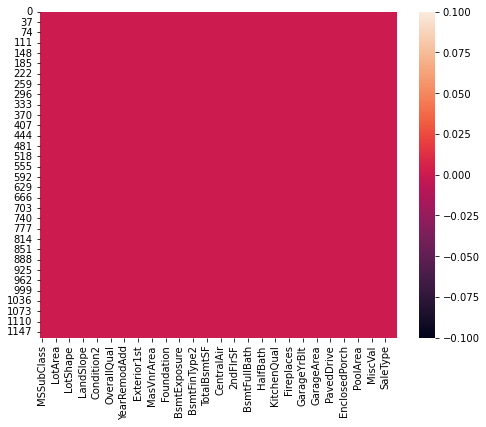

In [25]:
# let us visualize the same, using heat map
plt.figure(figsize=(8,6))
sns.heatmap(train_df.isna())

In [26]:
# Let us check any duplicate data is preset in our data
train_df.duplicated().sum()

0

So we does not have any duplicate data present in our datset,

In [27]:
#Now we will look statistical description of our data
train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,72.677481,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1977.078248,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,41.940650,29.783973,8957.442311,1.390153,1.124343,30.145255,20.785185,182.047152,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,25.104694,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1959.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,50.000000,70.000000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,70.000000,80.000000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,190.000000,472.437499,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


This gives the statistical information of the dataset. The summary of this dataset looks perfect since there is no negative/ invalid values present. It gives the summary of numerical data.

From the above description we can observe the following things

The counts of every column is same which means there are no missing values preent in the dataset.
Some features min,25%,50% were 0, so we will deal have to deal with them.
In some of the columns the mean value is greater than the median(50%), which means they are skewed to right.
The median(50%) is bit greater than mean in some of the columns so they are skewed to left.
From the description we can say that the mean sales price of the house is around 181477 dollars(say), maximum sale price is 755000 and min is 163995.
By summarizing the data we can notice that there is huge difference between maximum value and 75% percentile that leads to large number of outliers present in the dataset also we need to find out the best features.
I will remove these outliers using either Zscore or IQR method.

# Dealing with Time variables in train dataset
From the Dataset we have 4 year variables YearBuilt, YearRemodAdd, GarageYrBlt and YrSold . Converting them into age variables seem more meaningful, as they offer more information about the longevity of the feature.Let's extract age information from the datetime variables by taking difference in years between the year the house was built and the year the house was sold.

In [28]:
# Let's subtract built year by year sold in order to get  the age
train_df["AgeBuilt"] = train_df.YrSold - train_df.YearBuilt
train_df["AgeRemod"] = train_df.YrSold - train_df.YearRemodAdd
train_df["AgeGarage"] = train_df.YrSold - train_df.GarageYrBlt

In [29]:
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as wehave already extractedthe required value from it.
train_df.drop("YearBuilt",axis=1,inplace=True)
train_df.drop("YearRemodAdd",axis=1,inplace=True)
train_df.drop("GarageYrBlt",axis=1,inplace=True)

In [30]:
#let us check our Label values
train_df['SalePrice'].value_counts()

140000    18
135000    16
155000    12
139000    11
160000    11
145000    10
190000     9
130000     9
110000     9
125000     8
215000     8
129000     8
127000     8
115000     8
147000     8
185000     8
200000     7
128000     7
141000     7
175000     7
180000     7
176000     7
144000     7
230000     7
235000     7
100000     7
165000     7
173000     6
108000     6
170000     6
174000     6
205000     6
132500     6
148000     6
225000     5
158000     5
187500     5
137000     5
260000     5
239000     5
157000     5
250000     5
181000     5
240000     5
120000     5
124000     5
136500     5
152000     5
290000     5
143000     5
151000     5
178000     5
133000     5
172500     5
119000     4
184000     4
168000     4
191000     4
214000     4
163000     4
325000     4
137500     4
150000     4
127500     4
192000     4
171000     4
275000     4
207500     4
112000     4
118500     4
120500     4
132000     4
113000     4
123000     4
149900     4
189000     4
124500     4

These are the values counts of our SalePrice ie Label, so our project is Regression

# Data Visualization
# Univariate Analysis
# Plotting categorical columns

Pie plot for the column: MSZoning
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


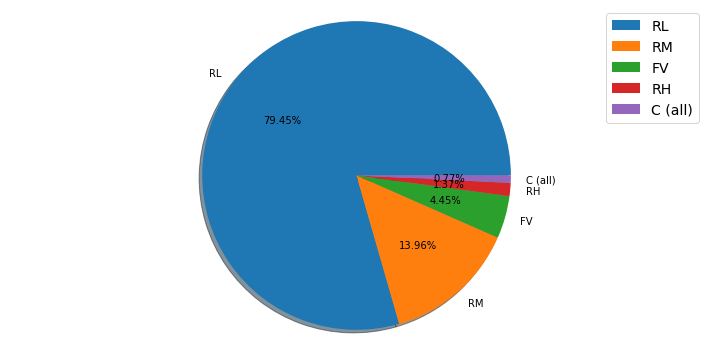

*****************************************************************************************************************************
Observations
From this we can Notice that around 80 % houses are in RL zone, Followed by RM zone around 14%, in other zone negligible houses are present


*****************************************************************************************************************************
Pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


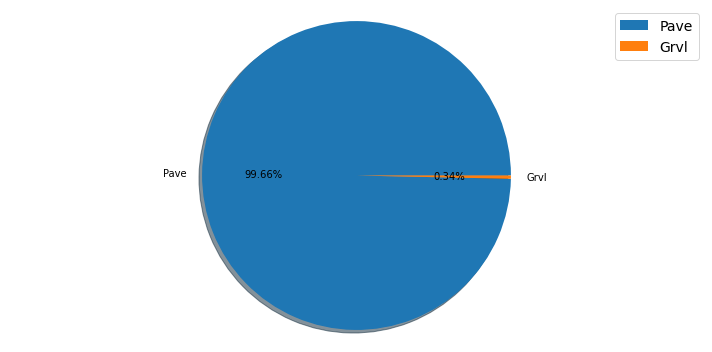

*****************************************************************************************************************************
Observations
From this we can notice that most of the street were Pave Type, So we me drop this features as it will not contribute much


*****************************************************************************************************************************
Pie plot for the column: Alley
NoAlley    1091
Grvl         41
Pave         36
Name: Alley, dtype: int64


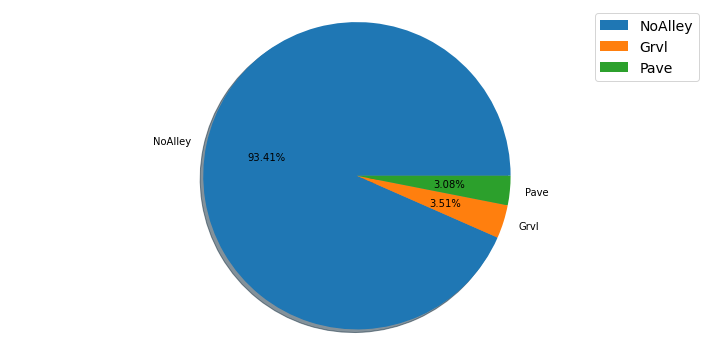

*****************************************************************************************************************************
Observations
From this we can notice that most of the houses does not have any alley 


*****************************************************************************************************************************
Pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


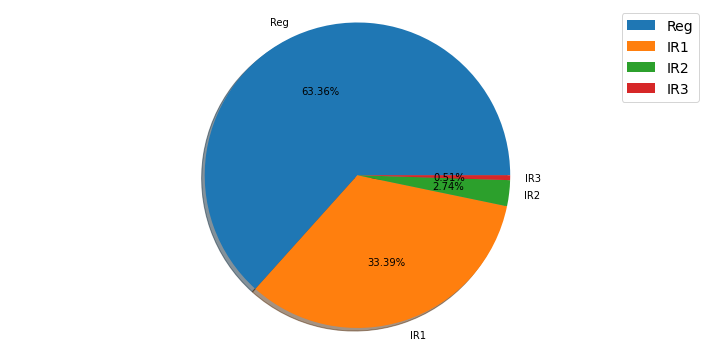

*****************************************************************************************************************************
Observations
In Lotshape most are regular shape, some are slightly irregular, other types were only few


*****************************************************************************************************************************
Pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


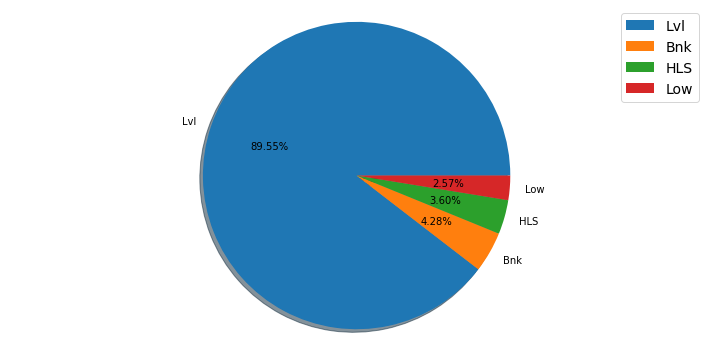

*****************************************************************************************************************************
Observations
Here also most houses are built in flat or level surface, 


*****************************************************************************************************************************
Pie plot for the column: LotConfig
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


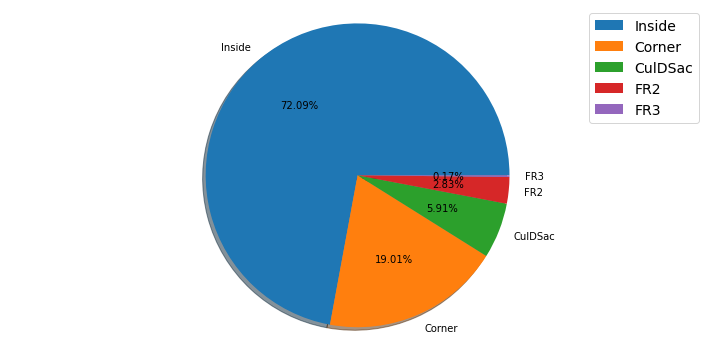

*****************************************************************************************************************************
Observations
most of the property were inside


*****************************************************************************************************************************
Pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


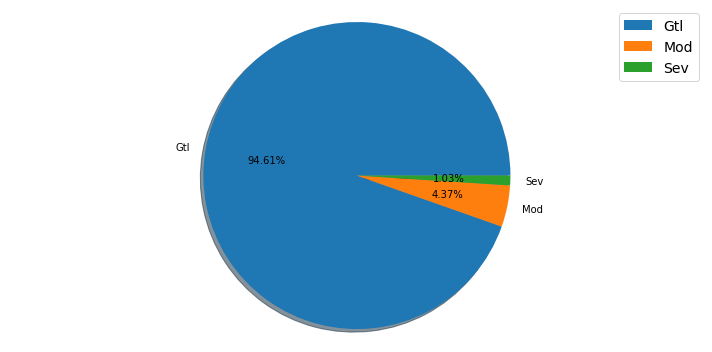

*****************************************************************************************************************************
Observations
About 95% of the property have gentle slop, only few have differance


*****************************************************************************************************************************
Pie plot for the column: Neighborhood
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


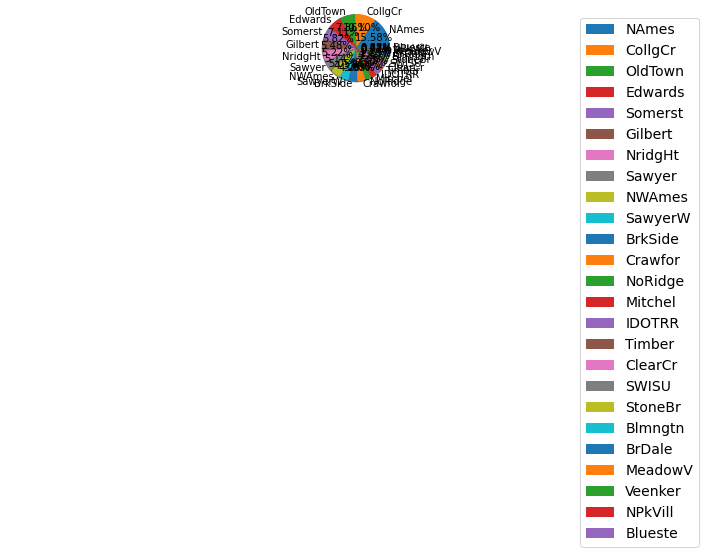

*****************************************************************************************************************************
Observations
This we will plot separately for more clarity 


*****************************************************************************************************************************
Pie plot for the column: Condition1
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


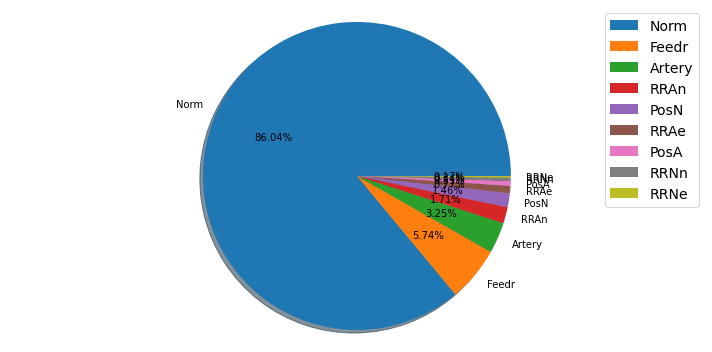

*****************************************************************************************************************************
Observations
Most of them were in normal condition


*****************************************************************************************************************************
Pie plot for the column: Condition2
Norm      1154
Feedr        6
PosN         2
Artery       2
RRAe         1
RRNn         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


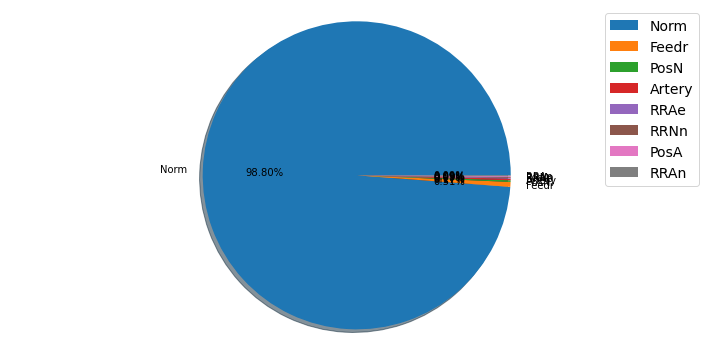

*****************************************************************************************************************************
Observations
Condition2 also more than about 99 % were norm, if needed we can delete this columns as it will not have much effect on Label


*****************************************************************************************************************************
Pie plot for the column: BldgType
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


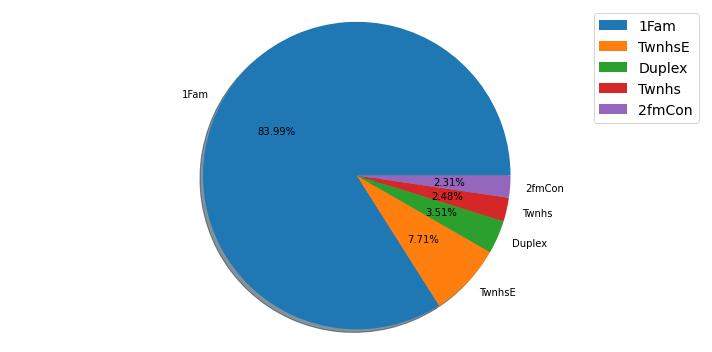

*****************************************************************************************************************************
Observations
Most of the building type is for single Family Type


*****************************************************************************************************************************
Pie plot for the column: HouseStyle
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


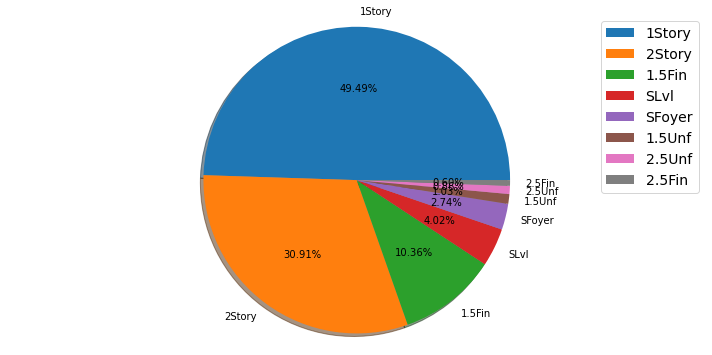

*****************************************************************************************************************************
Observations
Almost 50% of the buildings were 1 story, others were also have diferant counts


*****************************************************************************************************************************
Pie plot for the column: RoofStyle
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


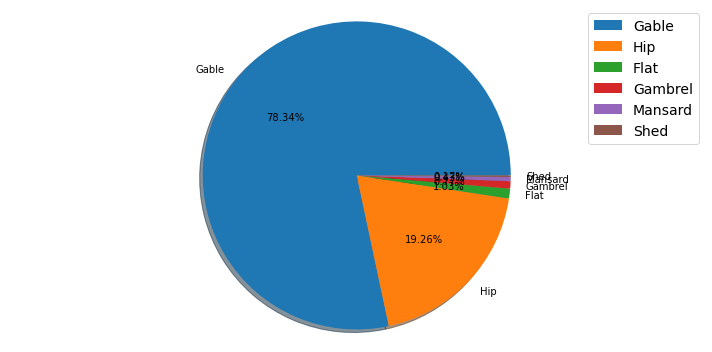

*****************************************************************************************************************************
Observations
About 80% roof styles were Gable type. followed by hip type


*****************************************************************************************************************************
Pie plot for the column: RoofMatl
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


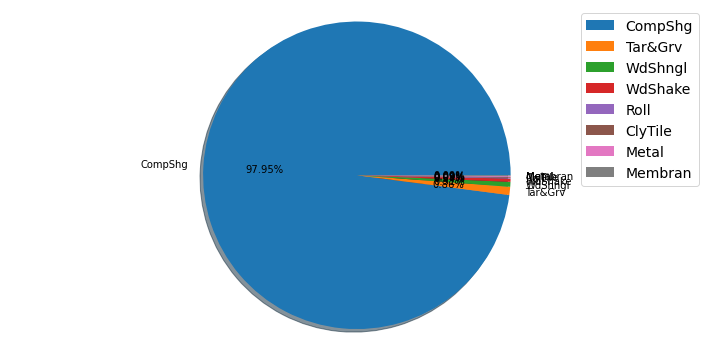

*****************************************************************************************************************************
Observations
Most of the roof material is standard materials


*****************************************************************************************************************************
Pie plot for the column: Exterior1st
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


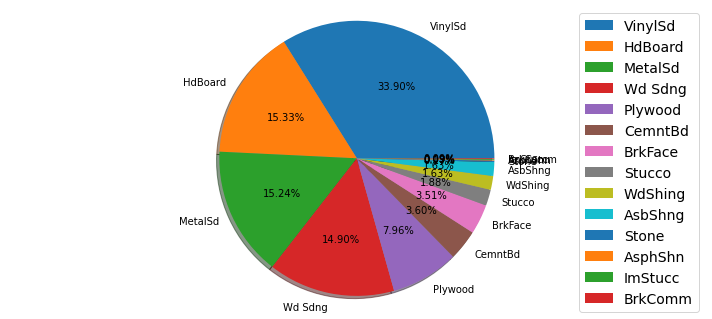

*****************************************************************************************************************************
Observations
This the properties where distributed over various types


*****************************************************************************************************************************
Pie plot for the column: Exterior2nd
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


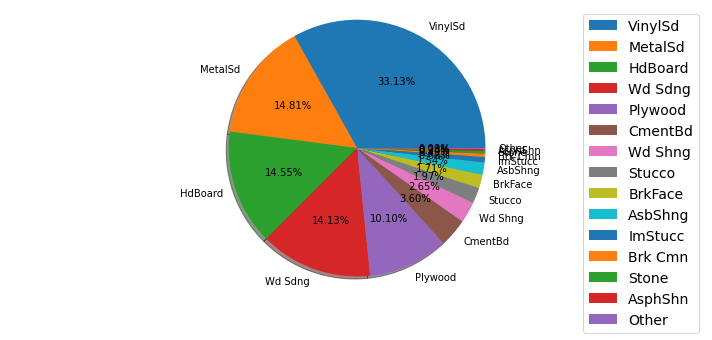

*****************************************************************************************************************************
Observations
Exterior second also houses have different types


*****************************************************************************************************************************
Pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


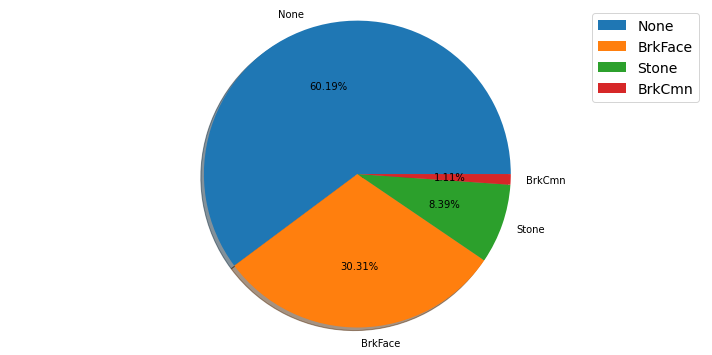

*****************************************************************************************************************************
Observations
Will Check


*****************************************************************************************************************************
Pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


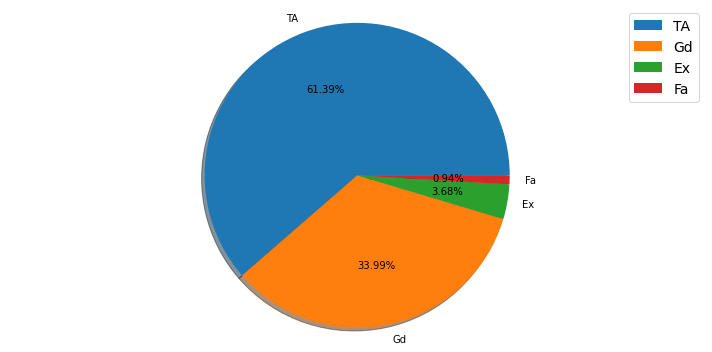

*****************************************************************************************************************************
Observations
External quality of material more than 60% were average type materials, followed by good material,Least is Fair material used 


*****************************************************************************************************************************
Pie plot for the column: ExterCond
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


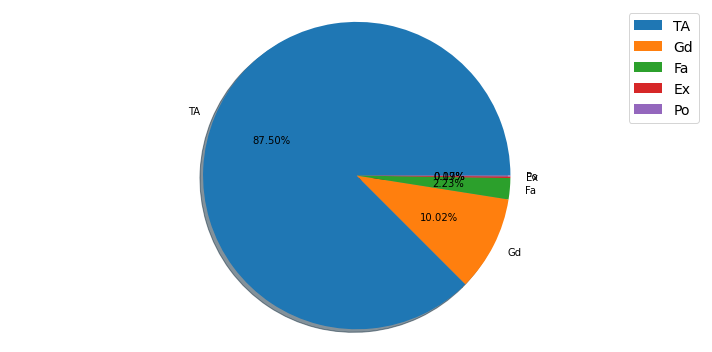

*****************************************************************************************************************************
Observations
Present Condition of the exterior material is almost 90 % is in Average quality


*****************************************************************************************************************************
Pie plot for the column: Foundation
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


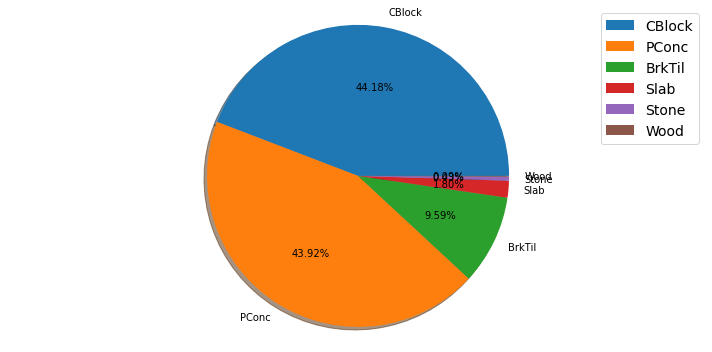

*****************************************************************************************************************************
Observations
Foundation of houses where shared equally by cinder block and poured concrete


*****************************************************************************************************************************
Pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


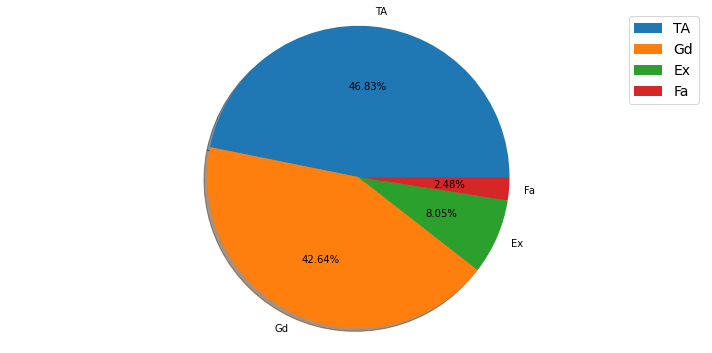

*****************************************************************************************************************************
Observations
basement height around 90% shared by Typical type and Good one


*****************************************************************************************************************************
Pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


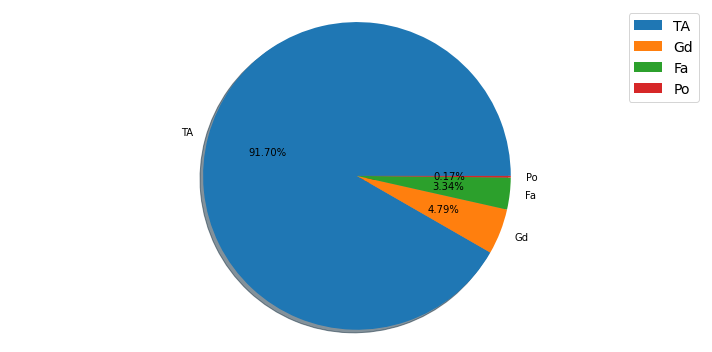

*****************************************************************************************************************************
Observations
Similar to exterior condition basement also the condition is average


*****************************************************************************************************************************
Pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


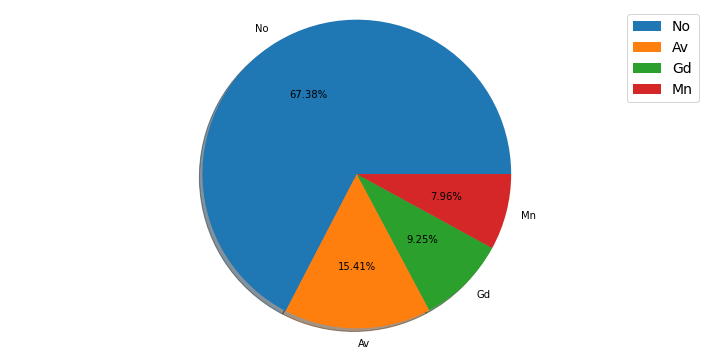

*****************************************************************************************************************************
Observations
Most of the cases no walk outs were available. the available one were avarage and good quality


*****************************************************************************************************************************
Pie plot for the column: BsmtFinType1
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


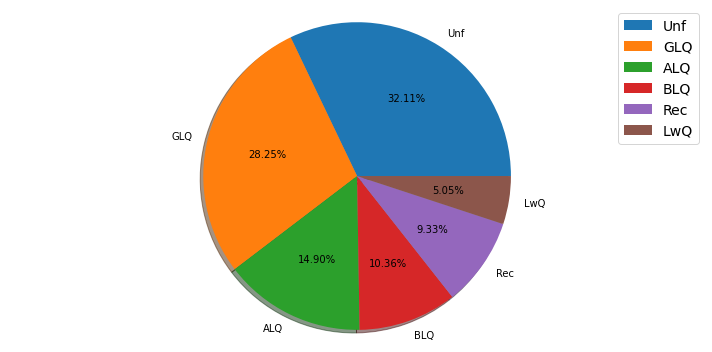

*****************************************************************************************************************************
Observations
Rating of basement is of all type


*****************************************************************************************************************************
Pie plot for the column: BsmtFinType2
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


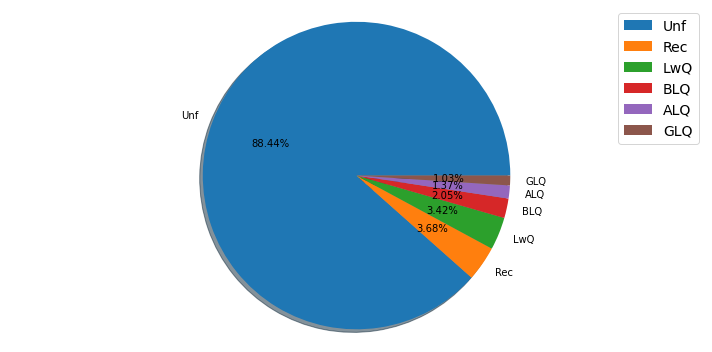

*****************************************************************************************************************************
Observations
Rating of basement finished area 90 percent unfinished, 


*****************************************************************************************************************************
Pie plot for the column: Heating
GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


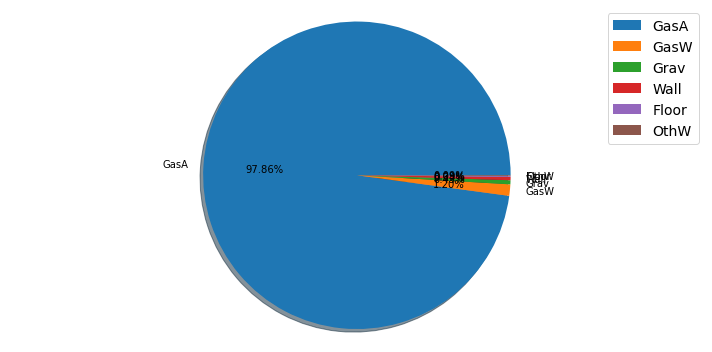

*****************************************************************************************************************************
Observations
Foe heating almost all used gas forced warm air furnace


*****************************************************************************************************************************
Pie plot for the column: HeatingQC
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


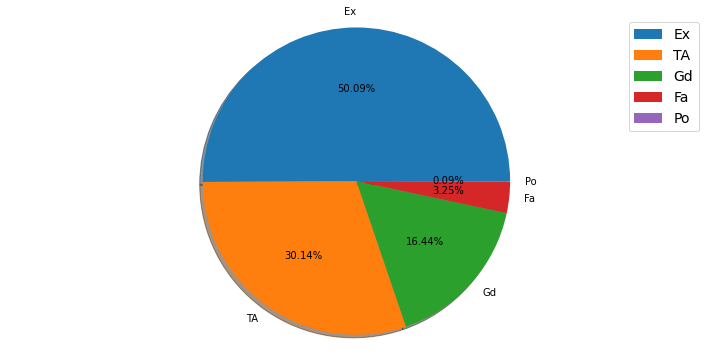

*****************************************************************************************************************************
Observations
Heating Quality 50% are good, Followed by average type and Good type


*****************************************************************************************************************************
Pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


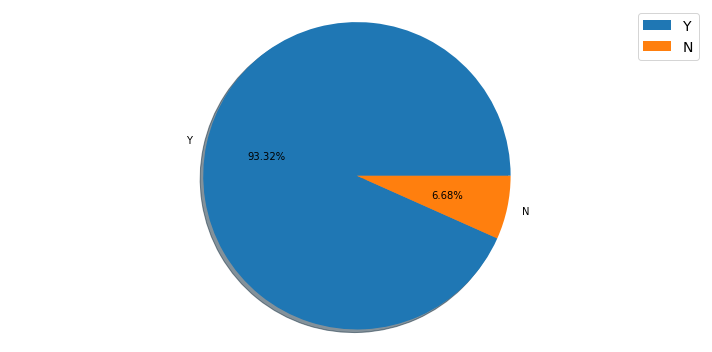

*****************************************************************************************************************************
Observations
almost all hoses provides central Air conditions


*****************************************************************************************************************************
Pie plot for the column: Electrical
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


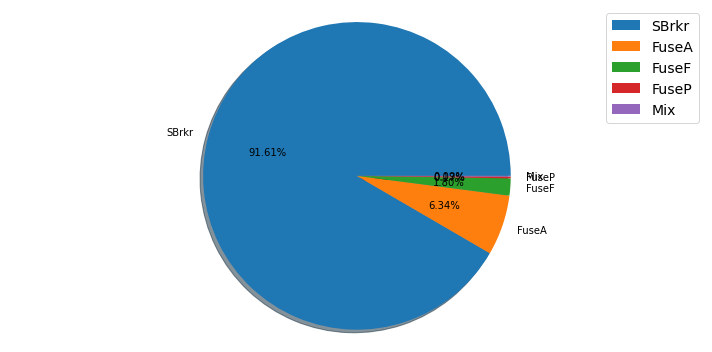

*****************************************************************************************************************************
Observations
most houses were installed with Standard Breaker, some of them were fuse box  system


*****************************************************************************************************************************
Pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


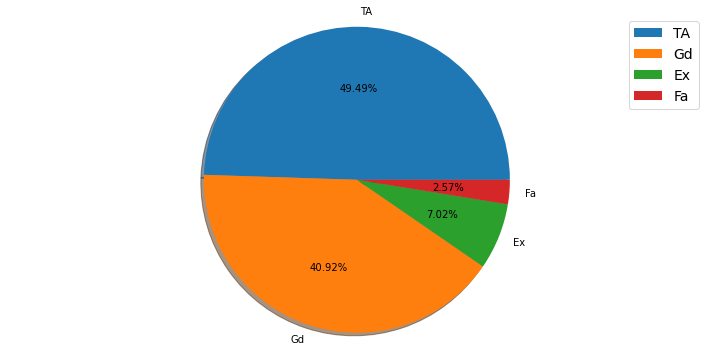

*****************************************************************************************************************************
Observations
Kitchen around 90% were goo and average quality type, followed by excellent and fair type


*****************************************************************************************************************************
Pie plot for the column: Functional
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


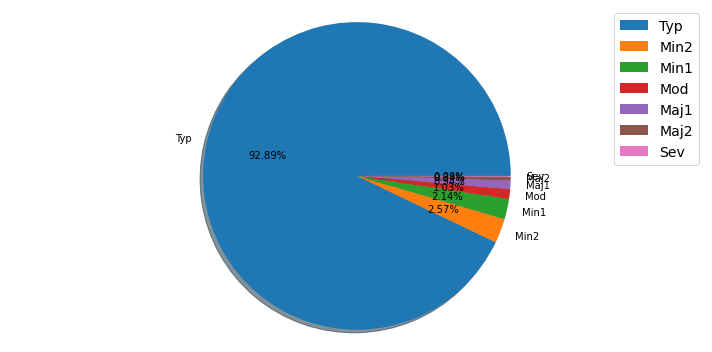

*****************************************************************************************************************************
Observations
Working conditions were 93% were typical one, remaining there are some defects 


*****************************************************************************************************************************
Pie plot for the column: FireplaceQu
NoFireplace    551
Gd             301
TA             252
Fa              25
Ex              21
Po              18
Name: FireplaceQu, dtype: int64


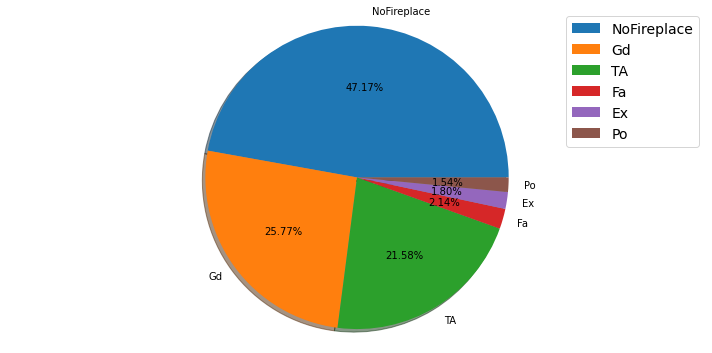

*****************************************************************************************************************************
Observations
50% does not have a separate fire place, the one with fire place were almost good and avarage


*****************************************************************************************************************************
Pie plot for the column: GarageType
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


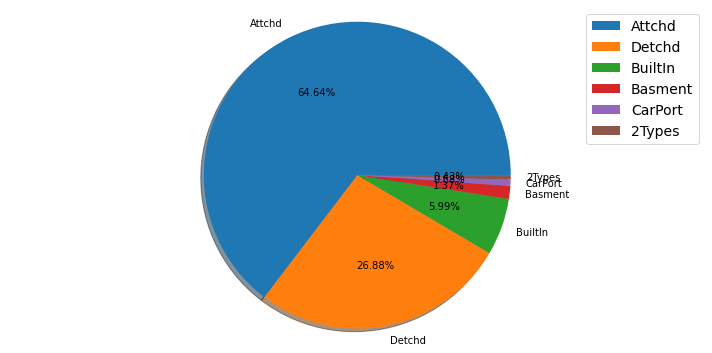

*****************************************************************************************************************************
Observations
Around 65% houses are with attached garages present, and 27% with detached garages


*****************************************************************************************************************************
Pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


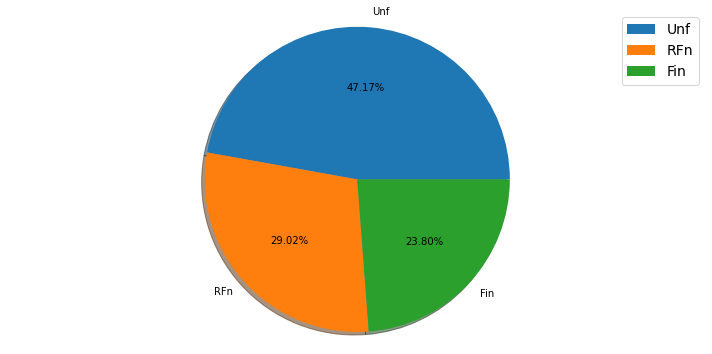

*****************************************************************************************************************************
Observations
Interior finish of the garages were 47% unfinished, and 29% rough finish, remaining 23% Finished type


*****************************************************************************************************************************
Pie plot for the column: GarageQual
TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


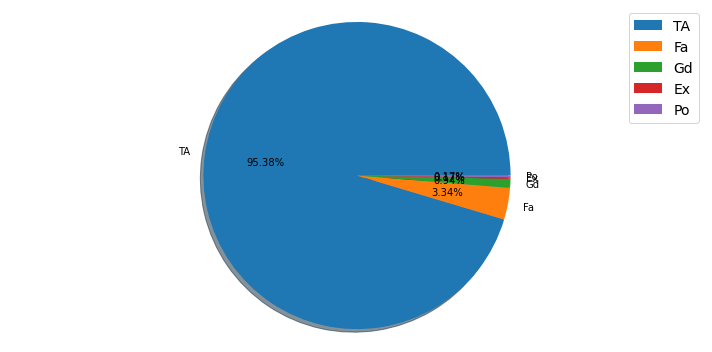

*****************************************************************************************************************************
Observations
Garage quality is above 95% is average types 


*****************************************************************************************************************************
Pie plot for the column: GarageCond
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


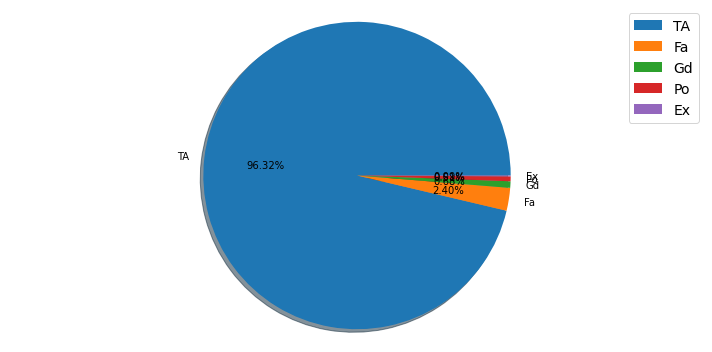

*****************************************************************************************************************************
Observations
present condition also average 


*****************************************************************************************************************************
Pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


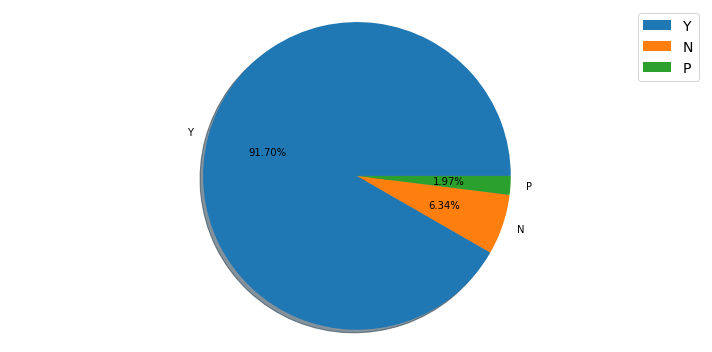

*****************************************************************************************************************************
Observations
about 92% hoses are with paved drive space were available


*****************************************************************************************************************************
Pie plot for the column: PoolQC
NoPool    1161
Gd           3
Ex           2
Fa           2
Name: PoolQC, dtype: int64


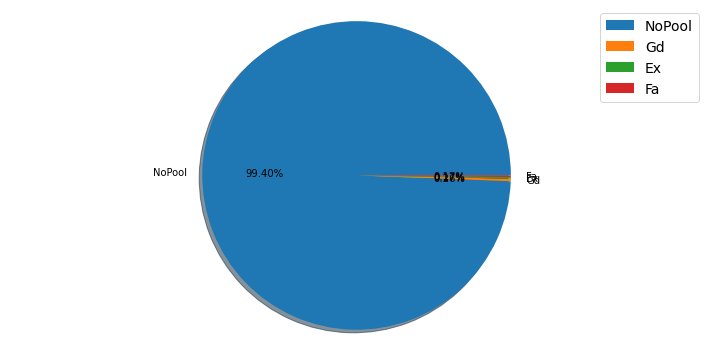

*****************************************************************************************************************************
Observations
more than 99% houses are without pool, so we can remove this feature


*****************************************************************************************************************************
Pie plot for the column: Fence
NoFecnce    931
MnPrv       129
GdPrv        51
GdWo         47
MnWw         10
Name: Fence, dtype: int64


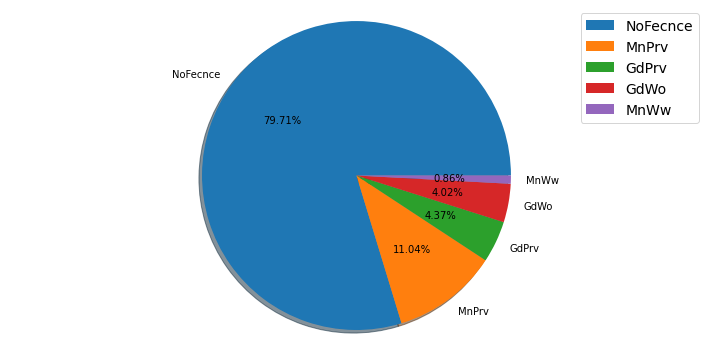

*****************************************************************************************************************************
Observations
Around 80% Houses are without fences


*****************************************************************************************************************************
Pie plot for the column: SaleType
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


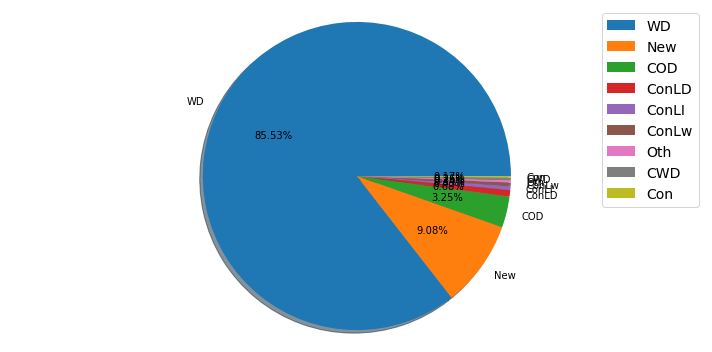

*****************************************************************************************************************************
Observations
most type were warranty deed with conventional type


*****************************************************************************************************************************
Pie plot for the column: SaleCondition
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


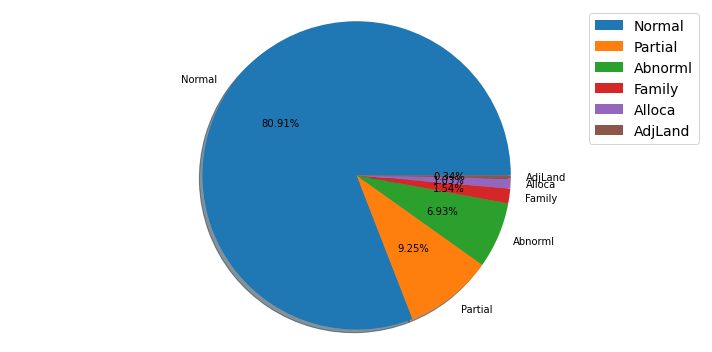

*****************************************************************************************************************************
Observations
almost 81 % were normal type sale available


*****************************************************************************************************************************


In [54]:
# Let us define one function for ploting pie chart
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()
# Ploting each categorical columns
for j in train_df[categorical_coltr]:
    print(f"Pie plot for the column:", j)
    print(train_df[j].value_counts())
    generate_pie(train_df[j])
    print("*"*125)
    print("Observations")
    input("")
    print('\n')
    print('*****'*25)

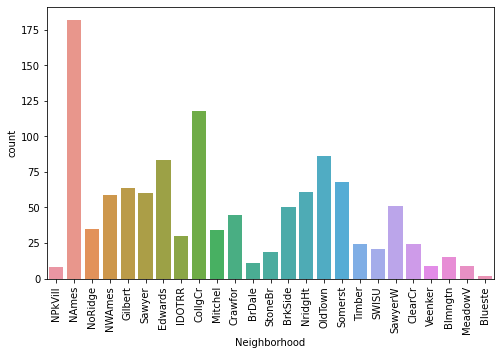

In [31]:
# LEt us visualise Neighborhood as it was not readable one
plt.figure(figsize=(8,5))
sns.countplot(train_df['Neighborhood'])
plt.xticks(rotation=90)
plt.show()

 Cities near to the houses and direction
 


We noticed that some features contains single data around 99% so we will 1st plot relation with them and sale price

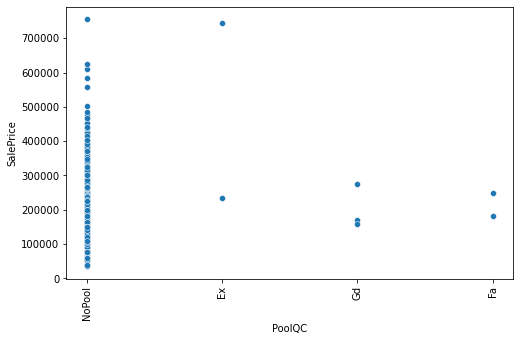

In [32]:
# LEt us visualise Neighborhood as it was not readable one
plt.figure(figsize=(8,5))
sns.scatterplot(train_df['PoolQC'],train_df['SalePrice'])
plt.xticks(rotation=90)
plt.show()

We can notice that even with no pool the price of house varies in between low to high, that means pool quality doesnot have much effects on sale price so we keep or drop them.


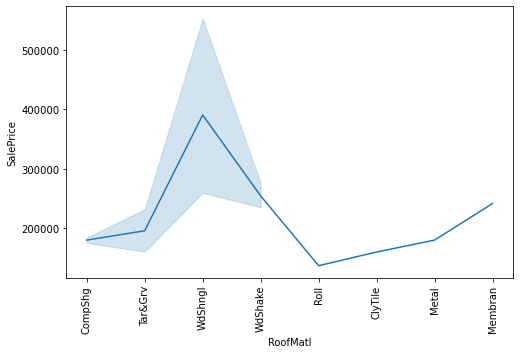

In [33]:
# LEt us visualise Neighborhood as it was not readable one
plt.figure(figsize=(8,5))
sns.lineplot(train_df['RoofMatl'],train_df['SalePrice'])
plt.xticks(rotation=90)
plt.show()

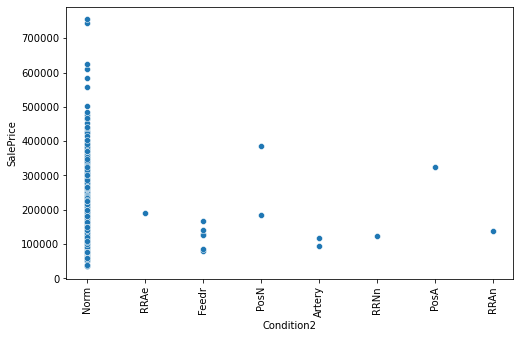

In [34]:
# LEt us visualise Neighborhood as it was not readable one
plt.figure(figsize=(8,5))
sns.scatterplot(train_df['Condition2'],train_df['SalePrice'])
plt.xticks(rotation=90)
plt.show()

Have some relation, but nomal have sale prices ranges from low to high

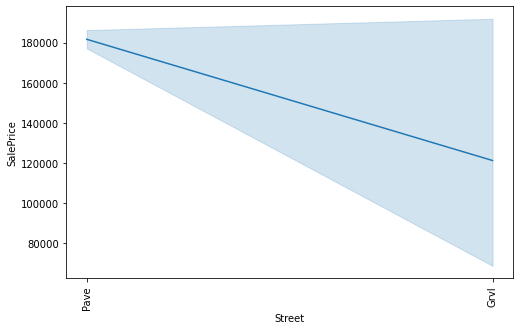

In [35]:
# LEt us visualise Neighborhood as it was not readable one
plt.figure(figsize=(8,5))
sns.lineplot(train_df['Street'],train_df['SalePrice'])
plt.xticks(rotation=90)
plt.show()

Even Pave street price is high, the gravel street price also varies from low to high

So we can drop Street ,PoolQc and Condition2 as they does not have much effect on our Label and about 99% of data is same. 

In [36]:
train_df.drop(['Street','Condition2','PoolQC'],axis=1,inplace=True)

In [37]:
# Remove the same from our catagorical coloumn also
categorical_coltr.remove('Street')
categorical_coltr.remove('Condition2')
categorical_coltr.remove('PoolQC')

# Now check remainig catagorical coloumns and sale price

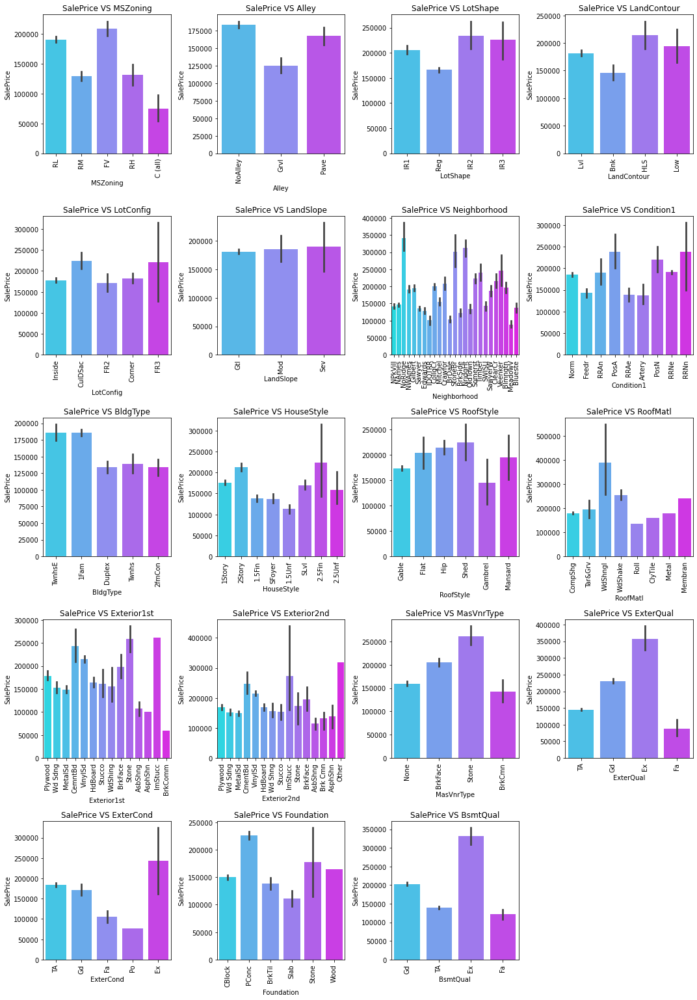

In [38]:
plt.figure(figsize=(15,25))
for i in range((len(categorical_coltr))//2):# First half of catagorical column
    plt.subplot(6,4,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[categorical_coltr[i]],palette="cool")
    plt.title(f"SalePrice VS {categorical_coltr[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

- Mzone Vs Sale price:- Houses in FL and Rv have high prices, Followed by RM and RH, All other the Lowest price
- Alley Vs Sale price:- Even houses with No alley have more prices than other two, As we already noticed No alley have high numbers over other two.
- LotShape, LandContour showing similar trend towards sale price
- LandSlop shows same prices in all categories
- In neighbourhood as number of houses increase sale price also increasing
- SalePrice vs Condition1: The houses having the conditions adjacent to postive off-site feature and houses within 200' of North-South Railroad have high sale price compared to others.
- SalePrice vs BldgType: Most of the houses are Single-family Detached and Townhouse End Unit and they have higher sale price compared to other categories.
- SalePrice vs HouseStyle: Houses which are having style of dwelling 2nd level finished and Two story have high sale price compared to other types.
- SalePrice vs RoofStyle: The houses having the roof style Flat, Hip and Shed have high sale price and the houses having gabrel roof style have less sale price.
- SalePrice vs RoofMatl: Houses with Wood Shingles root materials have high sale prices.
- SalePrice vs Exterior1st: Houses having Imitation Stucco, Stone and Cement Board as 1st exterior cover have high sale price.
- SalePrice vs Exterior2nd: Houses having Imitation Stucco and other as 2nd cover have high sale price.
- Saleprice Vs MasVnrType, stone and brick face have nigh sale price, 
- SalePrice Vs ExterQual, As we know Execelent quality have high price and so on.
- SalePrice vs ExterCond, Exalent have most price , but here avarage have more price than good,  Fair and poor quality have least price
- Sale Price vs Foundation, For Poured concreate and Stone concreate have high sale price, Wood alos have good price.
- Saleprice vs BsmtQual,  Obviously exalent quality have high price, Average and fair have low price compareed to others.


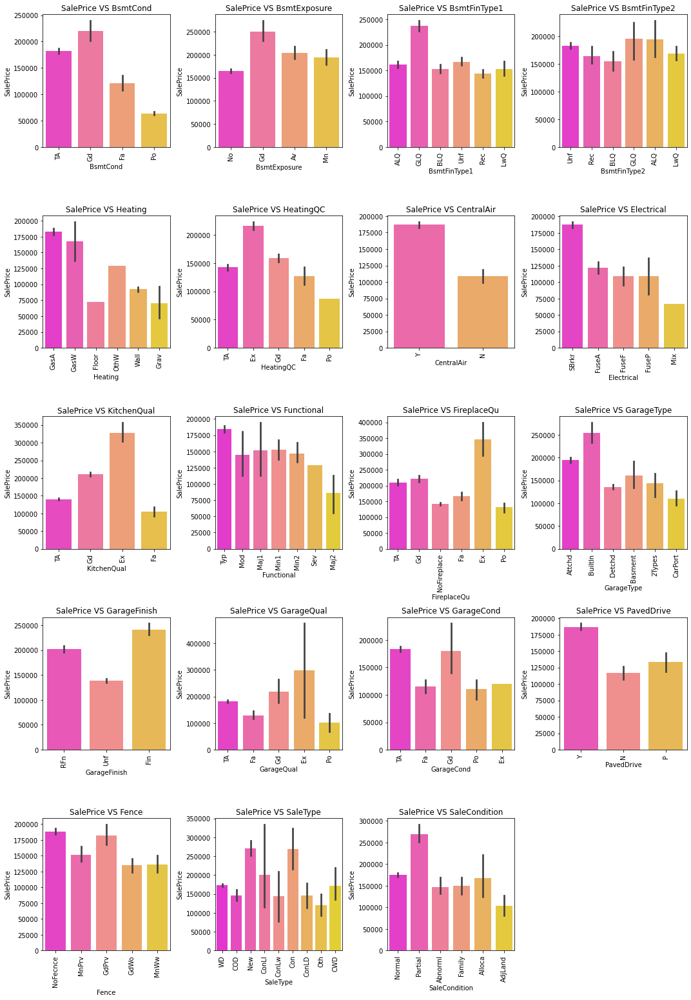

In [39]:
plt.figure(figsize=(15,25))
j=1
for i in range(19, (len(categorical_coltr))):# Second half of catagorical column 
    plt.subplot(6,4,j)
    sns.barplot(y=train_df['SalePrice'],x=train_df[categorical_coltr[i]],palette="spring")
    plt.title(f"SalePrice VS {categorical_coltr[i]}",fontsize=12)
    plt.xticks(rotation = 90) 
    j+=1
    plt.tight_layout()

- SalePrice vs BsmtCond: Houses having good basement condition have good price
- SalePrice vs BsmtExposure: Houses having good walkout or garden level walls have high sale price compared to others.
- SalePrice vs BsmtFinType1: The sale price is high for the houses containing good living quarters basement finished area.
- SalePrice vs BsmtFinType2: The sale price is moderately high for the houses having good living quarters and average living quarters.- 
- SalePrice vs Heating: The houses having the heating type gas forced warm air furnace and gas hot water or steam heat have high sale price.
- SalePrice vs CentralAir: Most of the houses have central air conditioning so it is obvious that these houses have high sale price.
- SalePrice vs Electrical: Most of the houses having standard circuit breakers & romex have high sale price compared to others.
- SalePrice Vs KitchenQual: Exalent condition have high price followed by good, avarage and fair
- SalePrice vs Functional: The houses having the typical functionality have maximum sales price and others have average sale price.
- SalePrice vs FireplaceQu: The houses having excellent exceptional masonry fireplace quality have high sale price and the houses having poor fireplace quality have very less sale price compared to others.
- SalePrice vs GarageType: The houses having built-in garage have high sale price compared to others.
- SalePrice vs GarageFinish: Garages located inside the house which is got finished have high sale price.
- SalePrice vs GarageQual GarageCond have same obivious trend.
- SalePrice vs PavedDrive: Houses having paved drive ways have high sale price.
- SalePrice vs Fense, does not have much effect as no fence also have good price
- SalePrice vs SaleType: Many houses having sale types as just constructed and sold and Contract 15% Down payment regular terms have high sale price.
- SalePrice vs SaleCondition: Houses having partial sale condition that is home was not completed when last assessed have high sale price.

# Polting Numerical and Label

In [40]:
numerical_coltr.remove('SalePrice')

In [41]:
numerical_coltr.remove("YearBuilt")
numerical_coltr.remove("YearRemodAdd")
numerical_coltr.remove("GarageYrBlt")

In [42]:
numerical_coltr.append('AgeBuilt')
numerical_coltr.append('AgeRemod')
numerical_coltr.append('AgeGarage')

In [43]:
len(numerical_coltr)

36

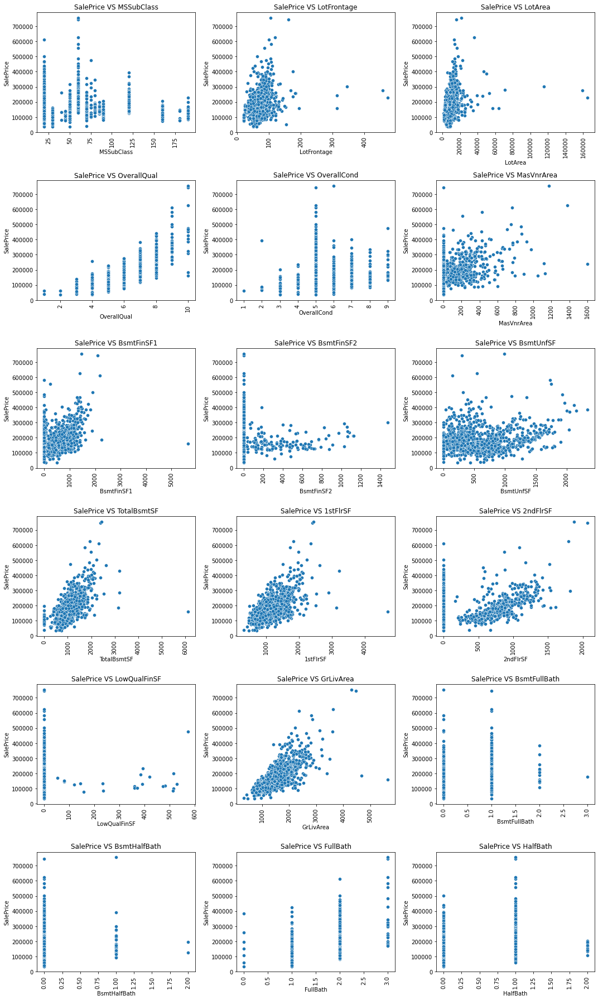

In [44]:
plt.figure(figsize=(15,25))
for i in range((len(numerical_coltr))//2):# First half of catagorical column
    plt.subplot(6,3,i+1)
    sns.scatterplot(y=train_df['SalePrice'],x=train_df[numerical_coltr[i]])
    plt.title(f"SalePrice VS {numerical_coltr[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

## Observations

In [45]:
len(numerical_coltr)

36

* OveralQuality Vs Sale Price have clear coliearity, as quality increase  sale price also increasing.
* But in Overal Condition the Middle rating have high prices
* Total Basement squarefeet, 1st floor squarefeet and Above grade (ground) living area square feet have a high linear relation with our Lable.


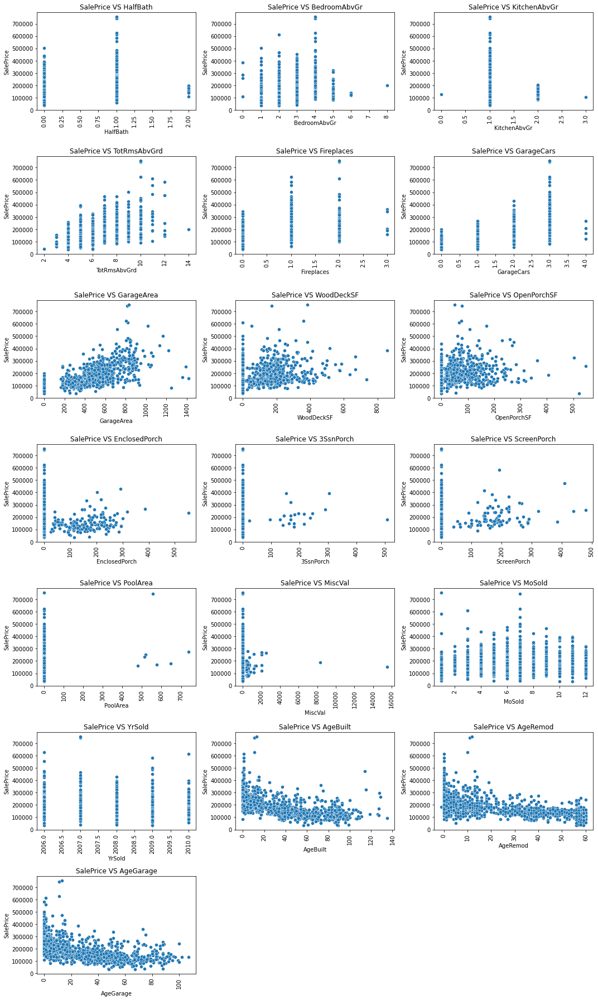

In [46]:
plt.figure(figsize=(15,25))
j=1
for i in range(17, (len(numerical_coltr))):# Second half of catagorical column 
    plt.subplot(7,3,j)
    sns.scatterplot(y=train_df['SalePrice'],x=train_df[numerical_coltr[i]],palette="spring")
    plt.title(f"SalePrice VS {numerical_coltr[i]}",fontsize=12)
    plt.xticks(rotation = 90) 
    j+=1
    plt.tight_layout()

* From this We can notice that Poolarea doesnot have any relation with sale price and Mis val alos does not have much effects so we can drop them
* As age of building, Age of Garage, Age renumeration increases then the sale price automaticaly decreses
* Garage area and sale price have a linear relation
* we can notcie many outliears in our data set

In [47]:
train_df.drop(['PoolArea','MiscVal'],axis=1,inplace=True)

In [48]:
numerical_coltr.remove('PoolArea')
numerical_coltr.remove('MiscVal')

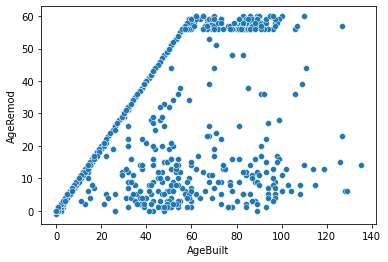

In [49]:
# Let us check any relation between Ageof Building and Age of Renomeartion have any relation
sns.scatterplot(train_df['AgeBuilt'],train_df['AgeRemod'])
plt.show()

* We can notcie some linear Relation between Age of Building and Age of Remodification

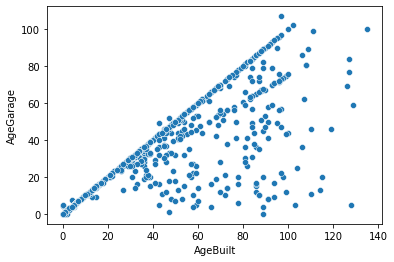

In [50]:
# Let us check any relation between Ageof Building and Age of Renomeartion have any relation
sns.scatterplot(train_df['AgeBuilt'],train_df['AgeGarage'])
plt.show()

This have a clear linear relation between Age Built and Age of Garage

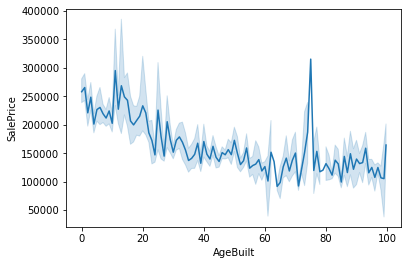

In [86]:
# Let us check any relation between Ageof Building and Age of Renomeartion have any relation
sns.lineplot(train_df['AgeBuilt'],train_df['SalePrice'])
plt.show()

We can clearly notice that as the age of the  House increases the sale price decreses

In [51]:
len(numerical_coltr)

34

# Identifying the outliers in train dataset

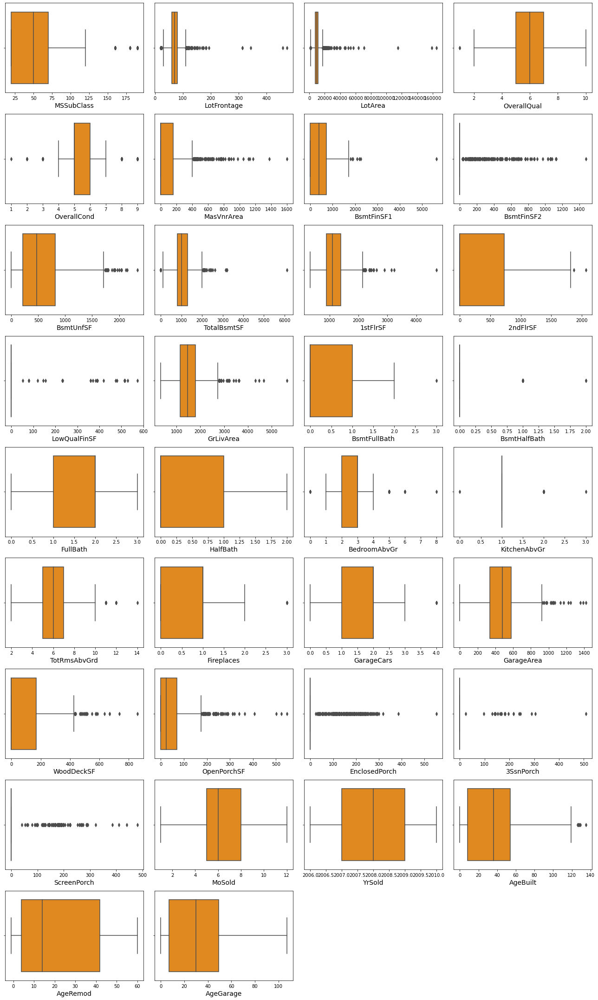

In [52]:
# Identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=34:
        ax=plt.subplot(9,4,plotnumber)
        sns.boxplot(train_df[column],color="darkorange")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

* All the features contains outliers except FullBath, HalfBath, MoSold, YrSold and AgeRemod.
* The features OverallQual and OverallCond seems to be categorical also, the column SalePrice is the label so I am not removing outliers in these columns.

Let's remove the outliers in the remaining columns using both Zscore, IQR method , Percentile Method and compare the result.

# Removing outliers in train dataset

In [53]:
# i) Zscore method

In [54]:
# Feature containing outliers
features_tr = train_df[['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2','BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF','LowQualFinSF' ,'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch' ,'AgeBuilt']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features_tr))
# Creating new dataframe
new_train_df = train_df[(z<3).all(axis=1)] 
new_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,120,RL,58.269422,4928,NoAlley,IR1,Lvl,Inside,Gtl,NPkVill,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,0,0,0,NoFecnce,2,2007,WD,Normal,128000,31,31,30.0
2,60,RL,92.000000,9920,NoAlley,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,0,0,0,NoFecnce,6,2007,WD,Normal,269790,11,10,10.0
3,20,RL,105.000000,11751,NoAlley,IR1,Lvl,Inside,Gtl,NWAmes,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,0,0,0,MnPrv,1,2010,COD,Normal,190000,33,33,33.0
5,60,RL,58.000000,14054,NoAlley,IR1,Lvl,Inside,Gtl,Gilbert,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,660,TA,TA,Y,100,17,0,0,0,NoFecnce,11,2006,New,Partial,219210,0,0,0.0
6,20,RL,74.897648,11341,NoAlley,IR1,Lvl,Inside,Gtl,Sawyer,Norm,1Fam,1Story,5,6,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,Unf,2,528,TA,TA,Y,0,0,0,0,95,NoFecnce,5,2010,WD,Normal,121500,53,14,53.0


In [55]:
# Checking the shape of dataset before and after removing outliers
print("Shape of train dataset before removing outliers:", train_df.shape)
print("Shape of train dataset after removing outliers:", new_train_df.shape)

Shape of train dataset before removing outliers: (1168, 73)
Shape of train dataset after removing outliers: (834, 73)


In [56]:
# Percentage of Data loss is
(1168-834)/1168*100

28.5958904109589

Around 28% of data is lost, So we will check with other method

# ii) IQR (Inter Quantile Range) method

In [57]:
# 1st quantile
Q1=features_tr.quantile(0.25)

# 3rd quantile
Q3=features_tr.quantile(0.75)

# IQR
IQR=Q3 - Q1

train_df1=train_df[~((train_df < (Q1 - 1.5 * IQR)) |(train_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [58]:
print("Shape of train data after using IQR method:", train_df1.shape)

Shape of train data after using IQR method: (507, 73)


In [59]:
# Checking the the data loss after removing outliers
data_loss = (1168-756)/1168*100
data_loss

35.273972602739725

By using Zscore and IQR method I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

# iii) Percentile Method

In [60]:
# Removing outliers in train data using percentile method 
for col in features_tr:
    if train_df[col].dtypes != 'object':
        percentile = train_df[col].quantile([0.01,0.98]).values
        train_df[col][train_df[col]<=percentile[0]]=percentile[0]
        train_df[col][train_df[col]>=percentile[1]]=percentile[1]
        

We have removed the outliers present in train dataset using percentile method.

# Checking for skewness in train data

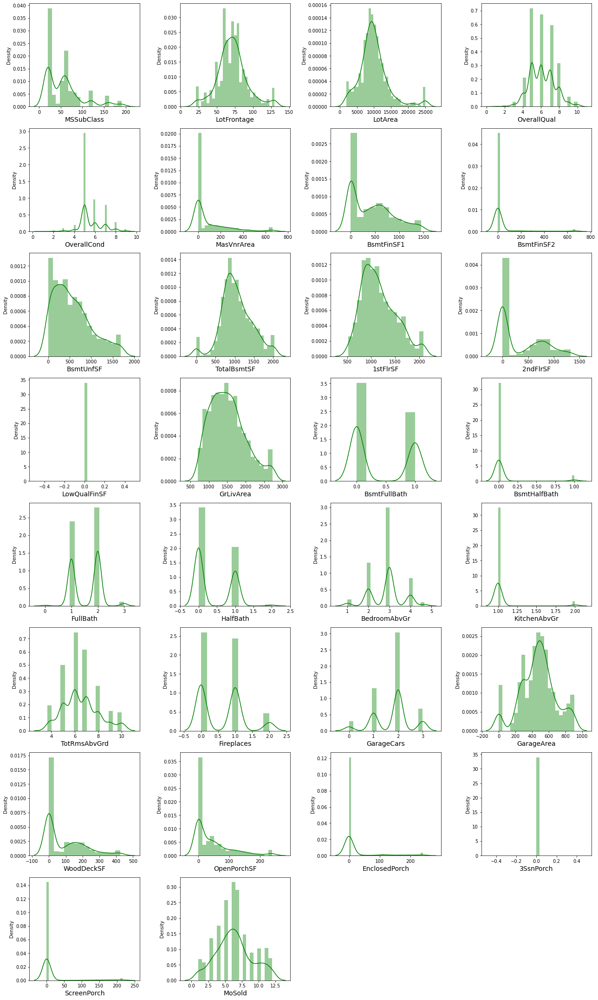

In [61]:
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(train_df[column],color="g")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

As there are many feature we can use skew for finding the skewness

In [62]:
# Checking the skewness
train_df.skew()

MSSubClass       1.422019
LotFrontage      0.379911
LotArea          1.191912
OverallQual      0.175082
OverallCond      0.580714
MasVnrArea       1.873138
BsmtFinSF1       0.639523
BsmtFinSF2       3.543134
BsmtUnfSF        0.777624
TotalBsmtSF      0.166773
1stFlrSF         0.645842
2ndFlrSF         0.717390
LowQualFinSF     0.000000
GrLivArea        0.592755
BsmtFullBath     0.355224
BsmtHalfBath     3.954345
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr    -0.145762
KitchenAbvGr     4.374289
TotRmsAbvGrd     0.443931
Fireplaces       0.552677
GarageCars      -0.434745
GarageArea      -0.135675
WoodDeckSF       1.053617
OpenPorchSF      1.513678
EnclosedPorch    2.623505
3SsnPorch        0.000000
ScreenPorch      3.381627
MoSold           0.220979
YrSold           0.115765
SalePrice        1.953878
AgeBuilt         0.469054
AgeRemod         0.495051
AgeGarage        0.564558
dtype: float64

The following features contains skewness more than +0.5 and -0.5

- MSSubClass
- LotArea
- OverallCond
- MasVnrArea
- BsmtFinSF1
- BsmtFinSF2
- BsmtUnfSF
- 1stFlrSF
- 2ndFlrSF
- GrLivArea
- BsmtHalfBath
- HalfBath
- KitchenAbvGr
- Fireplaces
- WoodDeckSF
- OpenPorchSF
- EnclosedPorch
- ScreenPorch
- SalePrice
- AgeGarage
Since OverallCond is categorical and SalePrice is label, so no need to remove skewness in these columns. Let's remove skewenss present in the remaining columns.



# Removing skewness using Yeo-Johnson method

In [63]:
skew1 = ["MSSubClass","LotArea","MasVnrArea","BsmtFinSF1","BsmtFinSF2","BsmtUnfSF","1stFlrSF","2ndFlrSF","GrLivArea","BsmtHalfBath","HalfBath","KitchenAbvGr","Fireplaces","WoodDeckSF","OpenPorchSF","EnclosedPorch","ScreenPorch","AgeGarage"]


In [64]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')


In [65]:
train_df[skew1] = scaler.fit_transform(train_df[skew1].values)
train_df[skew1].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,Fireplaces,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,AgeGarage
0,1.370435,-1.306083,-0.822896,-0.117054,-0.363019,0.916764,-0.481887,-0.871789,-1.281768,-0.238775,-0.782707,-3.122502e-17,0.779453,-0.960144,1.423871,-0.411301,-0.297551,0.249629
1,-1.167999,1.356458,-0.822896,0.395541,2.755953,1.042594,2.082190,-0.871789,1.377184,-0.238775,-0.782707,-3.122502e-17,0.779453,0.783831,1.428474,-0.411301,3.360785,0.477910
2,0.490047,0.113089,-0.822896,0.934402,-0.363019,-0.510359,0.048689,1.177246,1.060650,-0.238775,1.268421,-3.122502e-17,0.779453,1.047285,1.208580,-0.411301,-0.297551,-0.659823
3,-1.167999,0.530989,1.385487,0.803940,-0.363019,1.178365,1.665038,-0.871789,0.775546,-0.238775,-0.782707,-3.122502e-17,0.779453,-0.960144,1.178672,-0.411301,-0.297551,0.350863
4,-1.167999,1.497522,1.140684,1.189724,-0.363019,-0.230032,1.201931,-0.871789,0.322952,4.188040,-0.782707,-3.122502e-17,0.779453,1.139237,-1.062308,-0.411301,-0.297551,0.317730


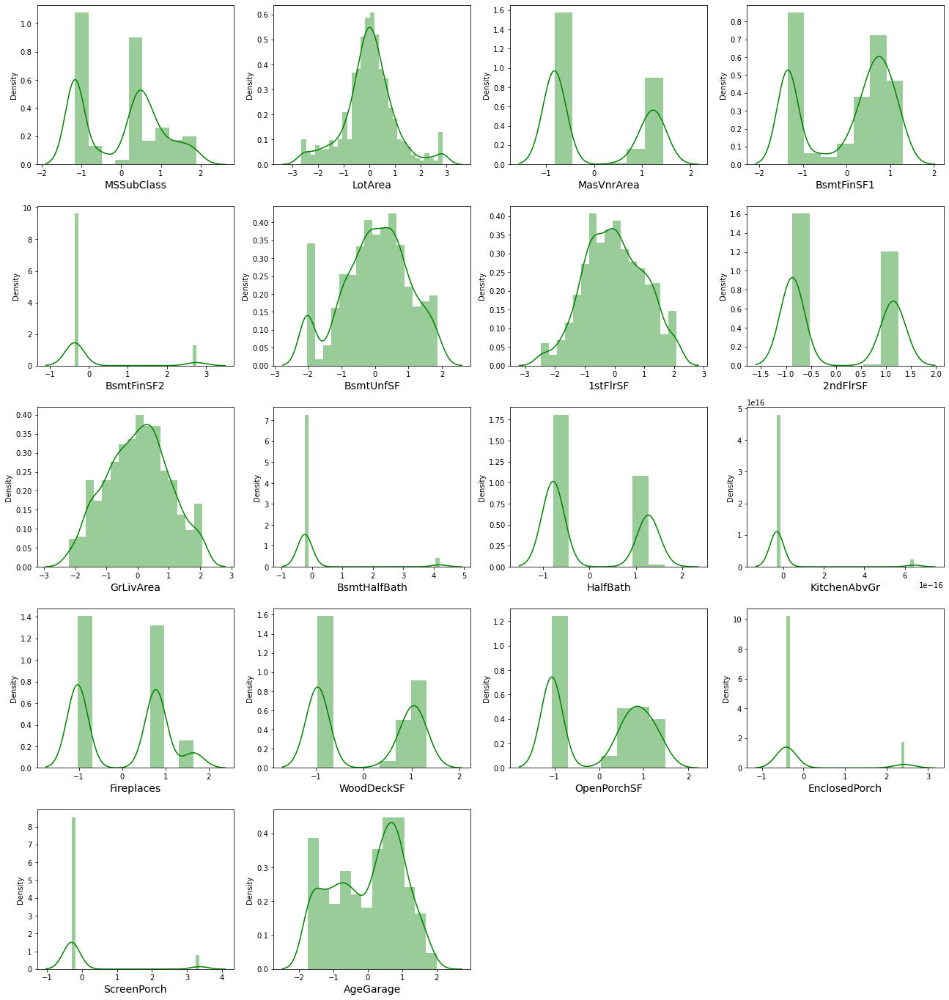

In [66]:
#Let us plot again
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in skew1:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(train_df[column],color="g")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

Here we can notcie that Skewness reduced al most all coloumns except KitchenAbvGr, ScreenPorch, EnclosedPorch, BSMTHalfBath, because almost above 95% of values are 0, So we can remove the same from or Datset

In [67]:
train_df.drop(['BsmtHalfBath','KitchenAbvGr','EnclosedPorch','ScreenPorch','3SsnPorch','LowQualFinSF'],axis=1,inplace=True)

# Encoding Train DataFrame

Some of the categorical columns are having the ratings based on specific condition. So I will replace them with ordinal encoding, others with Label encoder.



In [68]:
#Ordinal encoding
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
from sklearn.preprocessing import OrdinalEncoder
ord_enc=OrdinalEncoder()
for i in column:
    train_df[i] = ord_enc.fit_transform(train_df[i].values.reshape(-1,1))

In [69]:
#For remainig Label encoding
from sklearn.preprocessing import LabelEncoder
lbl_enc=LabelEncoder()
for i in train_df.columns:
    if train_df[i].dtypes == "object":
        train_df[i] =lbl_enc.fit_transform(train_df[i].values.reshape(-1,1))

In [70]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,3,58.269422,-1.306083,1,0,3,4,0,13,2,4,2,6,5,1,1,8,9,2,-0.822896,3.0,4.0,1,2.0,3.0,3,0,-0.117054,5,-0.363019,0.916764,1078.00,1,4.0,1,4,-0.481887,-0.871789,-1.281768,0,2,-0.782707,2.0,3.0,5.0,6,0.779453,5.0,1,1,2,440.0,4.0,4.0,2,-0.960144,1.423871,4,2,2007,8,4,128000,31.0,31,0.249629
1,-1.167999,3,95.000000,1.356458,1,0,3,4,1,12,2,0,2,8,6,0,5,12,13,2,-0.822896,2.0,2.0,2,3.0,1.0,1,0,0.395541,4,2.755953,1.042594,2025.14,1,0.0,1,4,2.082190,-0.871789,1.377184,1,2,-0.782707,4.0,2.0,8.0,6,0.779453,5.0,1,2,2,621.0,4.0,4.0,2,0.783831,1.428474,4,10,2007,8,4,268000,37.0,37,0.477910
2,0.490047,3,92.000000,0.113089,1,0,3,1,0,15,2,0,5,7,5,1,1,7,7,2,-0.822896,2.0,4.0,2,2.0,3.0,0,2,0.934402,5,-0.363019,-0.510359,1117.00,1,0.0,1,4,0.048689,1.177246,1.060650,1,2,1.268421,3.0,3.0,8.0,6,0.779453,5.0,1,2,2,455.0,4.0,4.0,2,1.047285,1.208580,4,6,2007,8,4,269790,11.0,10,-0.659823
3,-1.167999,3,105.000000,0.530989,1,0,3,4,0,14,2,0,2,6,6,3,1,8,9,1,1.385487,3.0,4.0,1,2.0,3.0,3,1,0.803940,5,-0.363019,1.178365,1844.00,1,0.0,1,4,1.665038,-0.871789,0.775546,0,2,-0.782707,3.0,3.0,7.0,6,0.779453,5.0,1,1,2,546.0,4.0,4.0,2,-0.960144,1.178672,2,1,2010,0,4,190000,33.0,33,0.350863
4,-1.167999,3,88.624427,1.497522,1,0,3,2,0,14,2,0,2,6,7,1,1,4,4,3,1.140684,2.0,4.0,1,2.0,3.0,3,0,1.189724,5,-0.363019,-0.230032,1602.00,1,2.0,1,4,1.201931,-0.871789,0.322952,0,2,-0.782707,3.0,2.0,8.0,6,0.779453,5.0,1,0,2,529.0,4.0,4.0,2,1.139237,-1.062308,4,6,2009,8,4,215000,32.0,9,0.317730


So we have encoded our data, 

# Correlation between the label and features using HEAT map in Train dataset

In [71]:
# Checking the correlation between features and the target
cor = train_df.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.026898,-0.323669,-0.312939,0.049082,0.067516,-0.030467,0.057130,-0.016595,-0.011619,-0.039101,0.586409,0.481353,0.122241,-0.033927,-0.138069,-0.028166,-0.048778,-0.069930,-0.028288,0.004875,-0.039219,0.002040,0.048143,-0.066777,-0.032104,-0.060011,0.084234,-0.100436,0.056615,-0.085278,-0.116225,-0.293377,0.071533,-0.025739,-0.111572,0.036332,-0.312472,0.558561,0.230677,-0.067705,0.197635,0.295003,0.078793,-0.037256,0.192707,0.037758,0.029802,0.065754,0.104343,-0.023714,0.000675,-0.075152,-0.045754,-0.048946,-0.086870,0.038922,0.062935,0.092557,0.010865,-0.042020,0.064683,-0.027825,-0.001252,0.005669,-0.055151,-0.040430
MSZoning,0.026898,1.000000,-0.079144,-0.058912,-0.415953,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,0.184815,-0.099269,-0.244844,0.123822,0.002336,0.037414,0.021518,-0.036041,-0.031322,0.030101,-0.032954,-0.065060,0.051188,0.119852,-0.015887,-0.079205,-0.037611,-0.016193,-0.086858,-0.009900,-0.188837,-0.125164,-0.000610,0.111689,-0.024508,-0.091684,0.009349,0.002908,0.125155,0.162566,-0.130963,-0.163414,-0.168881,-0.087375,-0.077280,0.006946,-0.182359,-0.070105,-0.051646,-0.004964,0.079854,0.004501,-0.133221,0.296616,0.174282,0.271310
LotFrontage,-0.323669,-0.079144,1.000000,0.718677,-0.083302,-0.196543,-0.050935,-0.233417,0.136810,0.077379,-0.005937,-0.481021,0.050365,0.201243,-0.040742,0.162372,0.120332,0.074379,0.094128,-0.060260,0.161434,-0.139983,0.028733,0.065156,-0.146069,0.045803,-0.140478,-0.046899,0.110094,-0.043652,0.050676,0.103706,0.333588,-0.038605,-0.045887,0.092039,0.076919,0.433137,-0.037124,0.348973,0.087269,0.188679,0.036654,0.284594,-0.140742,0.331840,-0.005741,0.265126,0.047092,-0.252555,-0.205446,0.297470,0.341352,0.043293,0.048899,0.089470,0.076707,0.161305,-0.052939,0.017671,-0.003434,-0.040540,0.051842,0.363390,-0.102119,-0.056485,-0.050213
LotArea,-0.312939,-0.058912,0.718677,1.000000,-0.105916,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,-0.524128,0.005503,0.190547,0.010314,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,-0.104632,-0.013921,0.009319,-0.123151,-0.006375,-0.144857,-0.043423,0.119301,-0.073788,0.092385,0.052521,0.332367,-0.021160,-0.022308,0.073866,0.053827,0.452791,0.009290,0.397820,0.108691,0.187219,0.061575,0.297515,-0.113870,0.369388,-0.025038,0.328380,0.037467,-0.201895,-0.155464,0.272560,0.319552,0.004145,0.043327,0.041033,0.125098,0.146222,-0.021102,0.021311,-0.039843,-0.022130,0.046115,0.394343,-0.029530,-0.031184,-0.002098
Alley,0.049082,-0.415953,-0.083302,-0.105916,1.000000,-0.043252,0.004087,0.014261,0.015515,0.041482,0.073344,0.181899,0.040801,0.106855,-0.103921,0.020086,0.002244,-0.001835,-0.021378,-0.017508,0.062549,-0.116135,0.087956,0.178620,-0.076182,0.059391,-0.013513,-0.041765,0.046463,0.002041,-0.004348,0.019547,0.061177,-0.086373,-0.065146,0.115771,0.081415,0.020131,-0.017585,0.017930,0.034300,0.089549,0.081456,-0.082790,-0.029464,-0.086871,0.015922,-0.006741,0.009847,-0.016756,-0.102313,0.062720,0.070527,0.103360,0.083053,0.081553,-0.024837,0.062717,0.043129,-0.025186,0.010096,0.008918,-0.000467,0.076717,-0.230937,-0.135131,-0.199767
LotShape,0.067516,0.053655,-0.196543,-0.287003,-0.043252,1.000000,0.081803

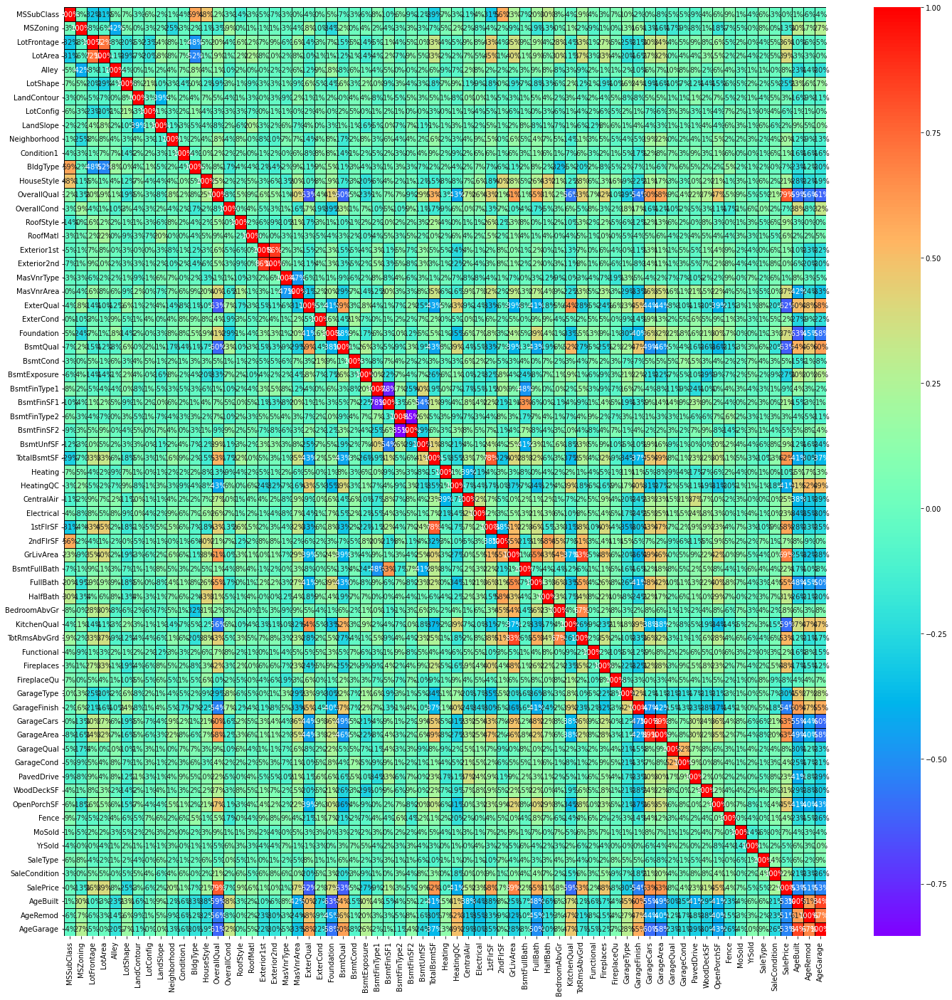

In [72]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(24,24))
sns.heatmap(cor,linewidth=0.5,linecolor='black',fmt='.0%',cmap='rainbow',annot=True)
plt.show()

We cannot interpret much from this so we will separate corelation with our label 

In [73]:
cor['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.688210
GarageCars       0.634573
GarageArea       0.627504
TotalBsmtSF      0.624311
1stFlrSF         0.575665
FullBath         0.554988
TotRmsAbvGrd     0.528564
Fireplaces       0.475531
OpenPorchSF      0.449961
LotArea          0.394343
Foundation       0.374169
MasVnrArea       0.373364
LotFrontage      0.363390
WoodDeckSF       0.310128
HalfBath         0.309808
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
BsmtFullBath     0.218620
SaleCondition    0.217687
BsmtFinSF1       0.212858
HouseStyle       0.205502
Neighborhood     0.198942
BsmtUnfSF        0.193140
RoofStyle        0.192654
BedroomAbvGr     0.177452
2ndFlrSF         0.167816
RoofMatl         0.159865
Fence            0.143922
GarageCond       0.135071
Functional       0.118673
ExterCond        0.115167
Exterior1st      0.108451
Condition1       0.105820
Exterior2nd      0.097541
GarageQual       0.080795
Alley       

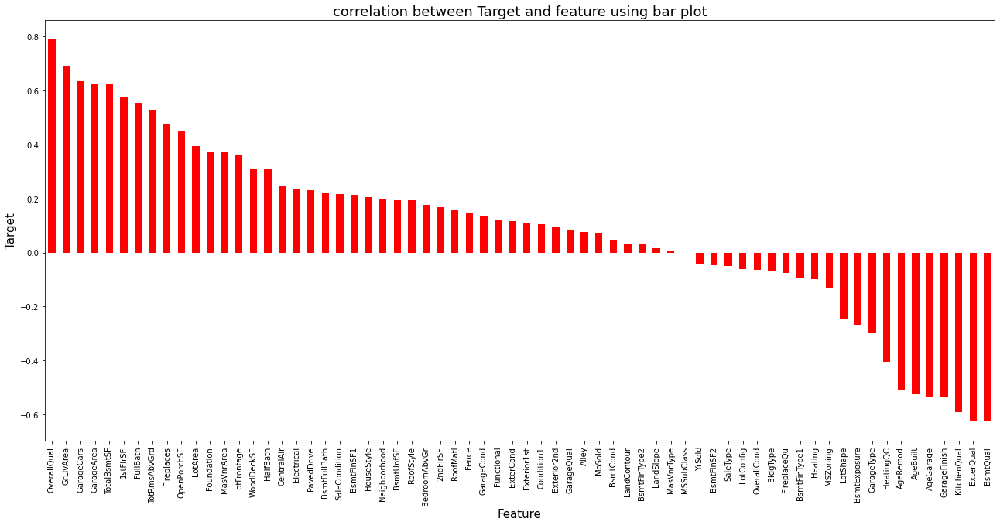

In [74]:
#Visualizing the same
plt.figure(figsize=(22,10))
train_df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='r')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between Target and feature using bar plot',fontsize=18)
plt.show()

Features having high Positive correlation with label

- OverallQual
- GrLivArea
- ExterQual 
- BsmtQual
- GarageCars
- GarageArea
- TotalBsmtSF
- 1stFlrSF
- FullBath
- TotRmsAbvGrd
- Fireplaces

Features having high Negative correlation with label

- Heating
- MSZoning
- LotShape
- BsmtExposure
- GarageType
- AgeRemod
- AgeGarage
- AgeBuilt
- GarageFinish

# Separating the feature and label into x and y

In [75]:
x = train_df.drop("SalePrice", axis=1)
y = train_df["SalePrice"]
# Dimension of x and y
x.shape, y.shape

((1168, 66), (1168,))

# Scaling Train data using StandardScaler

In [76]:
from sklearn.preprocessing import StandardScaler
# Scaling data
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,-0.021646,-0.636641,-1.306083,0.016675,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,0.671093,0.369322,-0.557836,-0.329500,0.293234,0.635539,-1.523529,-0.117054,0.310141,-0.363019,0.916764,0.067300,-0.11909,1.390230,0.267506,0.299036,-0.481887,-0.871789,-1.281768,-0.838227,0.793082,-0.782707,-1.144966,0.806154,-1.009429,0.261146,0.779453,1.626744,-0.693653,-0.288773,0.307737,-0.163806,0.215316,0.187193,0.291828,-0.960144,1.423871,0.472132,-1.617822,-0.605487,0.330033,0.207932,-0.189926,0.382860,0.249629
1,-1.167999,-0.021646,1.166999,1.356458,0.016675,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,-0.759266,-2.318331,0.852451,0.836731,-2.672114,-1.113129,-1.523529,0.395541,-0.771186,2.755953,1.042594,2.453434,-0.11909,-0.897602,0.267506,0.299036,2.082190,-0.871789,1.377184,1.192995,0.793082,-0.782707,1.475072,-0.394851,0.975397,0.261146,0.779453,1.626744,-0.693653,0.946709,0.307737,0.717359,0.215316,0.187193,0.291828,0.783831,1.428474,0.472132,1.361470,-0.605487,0.330033,0.207932,0.013316,0.671675,0.477910
2,0.490047,-0.021646,1.019685,0.113089,0.016675,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,-0.759266,0.369322,0.852451,-0.329500,0.293234,-1.987463,-0.434828,0.934402,0.310141,-0.363019,-0.510359,0.165553,-0.11909,-0.897602,0.267506,0.299036,0.048689,1.177246,1.060650,1.192995,0.793082,1.268421,0.165053,0.806154,0.975397,0.261146,0.779453,1.626744,-0.693653,0.946709,0.307737,-0.090782,0.215316,0.187193,0.291828,1.047285,1.208580,0.472132,-0.128176,-0.605487,0.330033,0.207932,-0.867400,-0.627990,-0.659823
3,-1.167999,-0.021646,1.658045,0.530989,0.016675,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,0.671093,0.369322,-0.557836,-0.329500,0.293234,0.635539,-0.979178,0.803940,0.310141,-0.363019,1.178365,1.997087,-0.11909,-0.897602,0.267506,0.299036,1.665038,-0.871789,0.775546,-0.838227,0.793082,-0.782707,0.165053,0.806154,0.313788,0.261146,0.779453,1.626744,-0.693653,-0.288773,0.307737,0.352235,0.215316,0.187193,0.291828,-0.960144,1.178672,-1.327054,-1.990233,1.651563,-4.612004,0.207932,-0.122178,0.479132,0.350863
4,-1.167999,-0.021646,0.853929,1.497522,0.016675,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,-0.759266,0.369322,-0.557836,-0.329500,0.293234,0.635539,-1.523529,1.189724,0.310141,-0.363019,-0.230032,1.387415,-0.11909,0.246314,0.267506,0.299036,1.201931,-0.871789,0.322952,-0.838227,0.793082,-0.782707,0.165053,-0.394851,0.975397,0.261146,0.779453,1.626744,-0.693653,-1.524255,0.307737,0.269474,0.215316,0.187193,0.291828,1.139237,-1.062308,0.472132,-0.128176,0.899213,0.330033,0.207932,-0.156052,-0.676126,0.317730


# Checking VIF(Variance Inflation Factor) values in train dataset

In [77]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.651955,MSSubClass
1,1.574508,MSZoning
2,2.627863,LotFrontage
3,3.031419,LotArea
4,1.378281,Alley
5,1.288251,LotShape
6,1.308573,LandContour
7,1.166990,LotConfig
8,1.447506,LandSlope
9,1.259292,Neighborhood


Here some features VIF score more than 10,and the maximum is "GrLivArea" ,so these feature causing multicollinearity problem. Let's drop them


In [78]:
x.drop("GrLivArea",axis=1,inplace=True)

In [79]:
# Checking VIF after removing the column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.632630,MSSubClass
1,1.574461,MSZoning
2,2.627341,LotFrontage
3,3.030891,LotArea
4,1.376837,Alley
5,1.286715,LotShape
6,1.308117,LandContour
7,1.166810,LotConfig
8,1.443168,LandSlope
9,1.255582,Neighborhood


Now all the feature have VIF less than 10 which means multicollinearity problem has been solved.

Now We have successfully completed preprocessing and data cleaning in Train Data set. Now it is time to build my machine learning models from train dataset.
# Also note that We have removed frollowing 
* Id
* Utilities
* MiscFeature
* YearBuilt
* YearRemodAdd
* GarageYrBlt
* 'Street'
* 'Condition2',
* 'PoolQC'
* 'PoolArea',
* 'MiscVal
* 'BsmtHalfBath'
* 'KitchenAbvGr',
* 'EnclosedPorch',
* 'ScreenPorch'
* 3SsnPorch
* LowQualFinSF
* GrLivArea

So all over we droped 18 features , Let us proceeds towards Model Building

# BUILDING ML MODELS FROM TRAIN DATASET

In [80]:
#Finding the Best Random State and Accuracy
# Importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.9019143742699477  on Random_state  50


We got our maxximum accuracy score at Random state 50

In [81]:
#Creating new train test split at our best Random State
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# Regression Algorithms

In [82]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso,Ridge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

# Linear Regression

R2_score: 0.8579868347248628
MAE: 20955.34724063457
MSE: 854783753.547932
RMSE: 29236.685064280664
Cross Validation Score: 0.8122900994202773


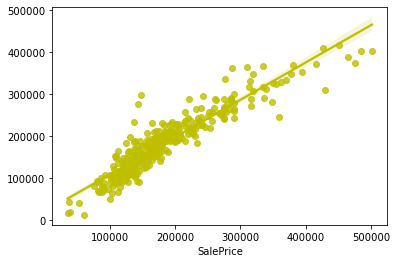

In [85]:
# Checking r2score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
lir=r2_score(y_test,predLR)
print('R2_score:',lir)


# Mean Absolute Error (MAE)
print('MAE:',mean_absolute_error(y_test, predLR))

# Mean Squared Error (MSE)
print('MSE:',mean_squared_error(y_test, predLR))

# Root Mean Squared Error (RMSE)
print("RMSE:",np.sqrt(mean_squared_error(y_test, predLR)))

# Checking Cross Validation Score for Linear Regression
lr_cv=cross_val_score(LR,x,y,cv=5).mean()
print("Cross Validation Score:",lr_cv)
# Visualizing the predicteed values
sns.regplot(y_test,predLR,color="y")
plt.show()

Created linear regression model and getting accuracy of 85.79% . From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

# Random Forest Regressor

R2_Score: 0.8965644034656057
MAE: 16723.614615384617
MSE: 622583598.3927484
RMSE: 24951.625165362442
Cross Validation Score: 0.8317792360570089


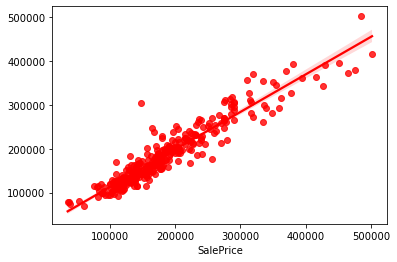

In [87]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
rfr=r2_score(y_test,predRFR)
print('R2_Score:',rfr)

# Metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:',metrics.mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

# Checking cv score for Lasso Regression
rfr_cv=cross_val_score(RFR,x,y,cv=5).mean()
print("Cross Validation Score:",rfr_cv)
dif4=rfr-rfr_cv
# Visualizing the predicteed values
sns.regplot(y_test,predRFR,color="r")
plt.show()

Here we are getting an accuracy of 89.65%

# ExtraTrees Regressor

R2_Score: 0.8781180930714428
MAE: 17511.38618233618
MSE: 733612786.4774203
RMSE: 27085.28726961227
Cross Validation Score: 0.8337825406268269


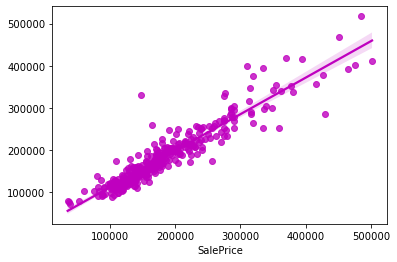

In [90]:
# Checking R2 score for Extra Trees Regressor

XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

# prediction
predXT=XT.predict(x_test)
etr=r2_score(y_test,predXT)
print('R2_Score:',etr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXT))
print('MSE:',metrics.mean_squared_error(y_test, predXT))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXT)))

# Checking cv score for ExtraTreesRegressor
etr_cv=cross_val_score(XT,x,y,cv=5).mean()
print("Cross Validation Score:",etr_cv)
dif5=etr-etr_cv
# Visualizing the predicteed values
sns.regplot(y_test,predXT,color="m")
plt.show()

The Extra Trees Regressor providing us a accuracy of 88.37%

# GradientBoosting Regressor

R2_Score: 0.9056761647120616
MAE: 15924.608629276257
MSE: 567739489.6469958
RMSE: 23827.284563017158
Cross Validation Score: 0.8157767382752649


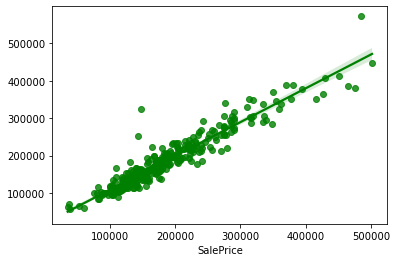

In [91]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# prediction
predGB=GB.predict(x_test)
gbr=r2_score(y_test,predGB)
print('R2_Score:',gbr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:',metrics.mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predGB)))

# Checking cv score for Gradient Boosting Regressor
gbr_cv=cross_val_score(GB,x,y,cv=5).mean()
print("Cross Validation Score:",gbr_cv)
dif6=gbr-gbr_cv
# Visualizing the predicteed values
sns.regplot(y_test,predGB,color="g")
plt.show()

# Extreme Gradient Boosting Regressor (XGB)

R2_Score: 0.8737021183633444
MAE: 18227.191628828346
MSE: 760192740.7319989
RMSE: 27571.593003161768
Cross Validation Score: 0.8115297346217666


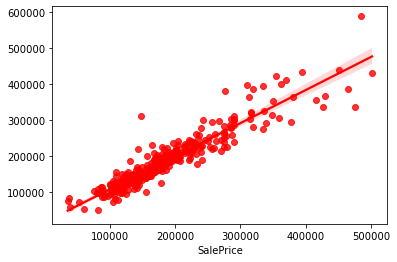

In [92]:
# Checking R2 score for XGB Regressor
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train,y_train)

# prediction
predXGB=XGB.predict(x_test)
xgb=r2_score(y_test,predXGB)
print('R2_Score:',xgb)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXGB))
print('MSE:',metrics.mean_squared_error(y_test, predXGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXGB)))

# Checking cv score for XGB Regressor
xgb_cv=cross_val_score(XGB,x,y,cv=5).mean()
print("Cross Validation Score:",xgb_cv)
dif7=xgb-xgb_cv
# Visualizing the predicteed values
sns.regplot(y_test,predXGB,color="r")
plt.show()

Our XGB REgressor is givning us an accuracy of 87.37%

# BaggingRegressor

R2_Score: 0.8656832123295627
MAE: 18776.258689458693
MSE: 808458903.8417662
RMSE: 28433.411751700958
Cross Validation Score: 0.8060760081333976


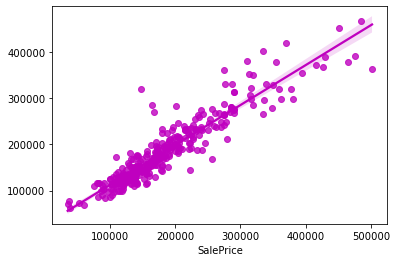

In [93]:
# Checking R2 score for BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train,y_train)

# prediction
predBR=BR.predict(x_test)
br1=r2_score(y_test,predBR)
print('R2_Score:',br1)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:',metrics.mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predBR)))

# Checking cv score for BaggingRegressor
br_cv=cross_val_score(BR,x,y,cv=5).mean()
print("Cross Validation Score:",br_cv)
dif8=br1-br_cv
# Visualizing the predicteed values
sns.regplot(y_test,predBR,color="m")
plt.show()

In [94]:
# Checking the Cross Validation score
model_list=['Linear Regressor','Random Forest Regressor','Extra Trees Regressor','Gradient Boosting Regressor','XGB Regressor','Bagging Regressor']
accuracyscore=[lir,rfr,etr,gbr,xgb,br1]
crossvalidationscore=[lr_cv,rfr_cv,etr_cv,gbr_cv,xgb_cv,br_cv]

In [99]:
models=pd.DataFrame({})
models["Regressor Type"]=model_list
models["Accuracy score"]=accuracyscore #
models["Cross validation Score"]=crossvalidationscore
models['Difference']=models['Accuracy score']-models['Cross validation Score']

models

,Regressor Type,Accuracy score,Cross validation Score,Difference
0,Linear Regressor,0.857987,0.812290,0.045697
1,Random Forest Regressor,0.896564,0.831779,0.064785
2,Extra Trees Regressor,0.878118,0.833783,0.044336
3,Gradient Boosting Regressor,0.905676,0.815777,0.089899
4,XGB Regressor,0.873702,0.811530,0.062172
5,Bagging Regressor,0.865683,0.806076,0.059607


From this We can notice that Extra Tree Regressor is the best alogorithm, As the least difference between Accuracy ascore and Cross Validation score

# Hyper parameter tuning

In [101]:
parameters={'n_estimators':[1,3,5,6],
          'max_features' : ["sqrt", "log2"],
          'criterion' : ["squared_error", "absolute_error"],
          'random_state':[10,50,100,51]}

GCV=GridSearchCV(ExtraTreesRegressor(),parameters,cv=5)

In [102]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [1, 3, 5, 6],
                         'random_state': [10, 50, 100, 51]})

In [103]:
GCV.best_score_

0.7770695673909429

In [104]:
GCV.best_params_

{'criterion': 'squared_error',
 'max_features': 'log2',
 'n_estimators': 5,
 'random_state': 50}

In [107]:
Final_Model=ExtraTreesRegressor(criterion='squared_error',max_features='log2',n_estimators= 5,random_state= 50)

In [108]:
# Prediction
Final_Model.fit(x_train, y_train)
pred = Final_Model.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)

R2_Score: 80.88383234643375


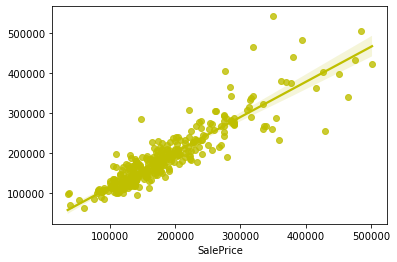

In [110]:
# Visualizing the predicteed values
sns.regplot(y_test,pred,color="y")
plt.show()

In [ ]:
# Important Features

In [215]:
# Lets chkeck the feature importance 

importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(Final_Model.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
OverallQual,0.247
TotalBsmtSF,0.145
KitchenQual,0.060
1stFlrSF,0.036
GarageArea,0.034
HalfBath,0.028
GarageCars,0.027
BsmtQual,0.021
Fireplaces,0.020


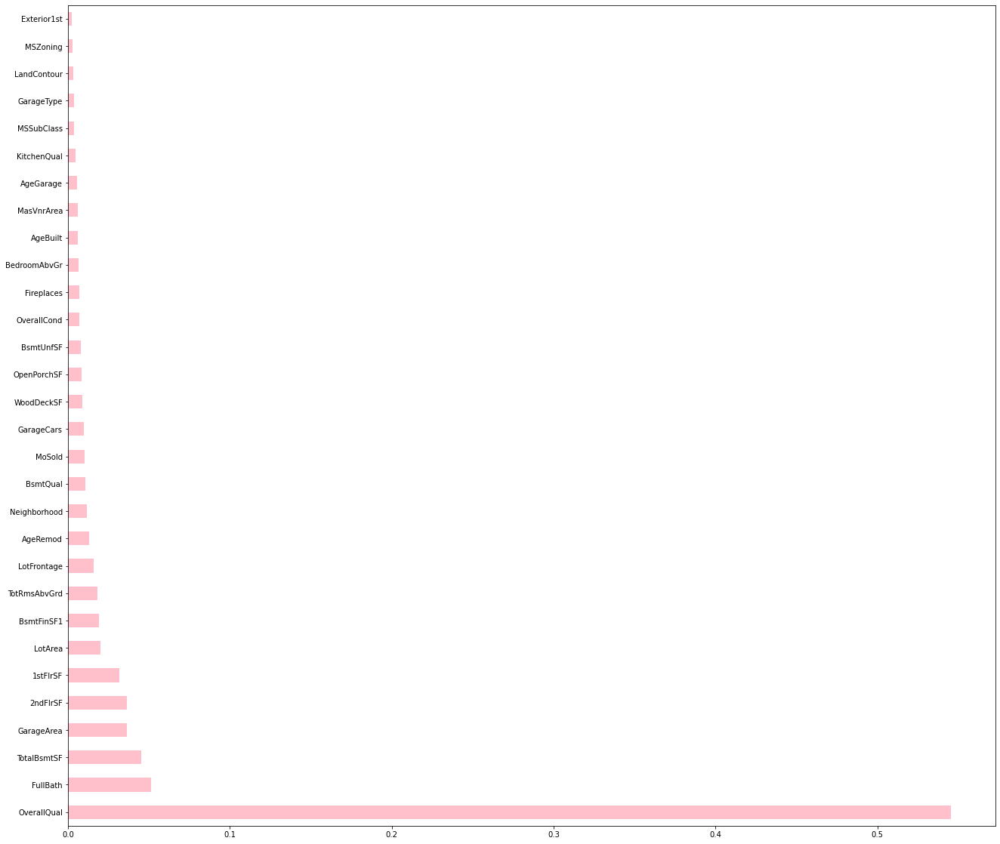

In [217]:
# Plotting the same
plt.figure(figsize=(22,20))
importances=pd.Series(RFR.feature_importances_,index=x.columns)
importances.nlargest(30).plot(kind='barh',color="pink")
plt.show()

# Saving the Final model

In [111]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_Model,"HousingPricePrediction.pkl")

['HousingPricePrediction.pkl']

# Now Load Test Data

In [190]:
test_df=pd.read_csv('test.csv')
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [191]:
test_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
  

In [192]:
test_df.shape

(292, 80)

In [193]:
test_df.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

# Imputing Data into Categorical coloumns

In [194]:
test_df['Alley'].fillna('NoAlley',inplace=True)# as provided in feature discription
test_df['Fence'].fillna('NoFecnce',inplace=True)# provided in feature discription
test_df['FireplaceQu'].fillna('NoFireplace',inplace=True)# provided in feature selection

In [195]:
#Now for remaining we will fill Na with Mode value
col1=test_df.columns.values
for i in range(0,len(col1)):
    if test_df[col1[i]].dtype == "object":
        test_df[col1[i]].fillna(test_df[col1[i]].mode()[0], inplace=True)

In [199]:
iter_impute=IterativeImputer()
df_imp=pd.DataFrame(iter_impute.fit_transform(test_df[['LotArea','LotFrontage']]),columns=['LotArea','LotFrontage'])
test_df['LotFrontage']=df_imp['LotFrontage']
test_df['MasVnrArea'].fillna(test_df['MasVnrArea'].mean(),inplace=True)
test_df['GarageYrBlt'].fillna(test_df['GarageYrBlt'].mean(),inplace=True)

In [200]:
test_df.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         0
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [201]:
# Let's subtract built year by year sold in order to get  the age
test_df["AgeBuilt"] = test_df.YrSold - test_df.YearBuilt
test_df["AgeRemod"] = test_df.YrSold - test_df.YearRemodAdd
test_df["AgeGarage"] = test_df.YrSold - test_df.GarageYrBlt

In [202]:
test_df.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         0
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [203]:
# So we have to drop the features that we droped in Train data
test_df.drop(['Id','Utilities','MiscFeature','YearBuilt','YearRemodAdd','GarageYrBlt','Street','Condition2','PoolQC','PoolArea','MiscVal','BsmtHalfBath','KitchenAbvGr', 'EnclosedPorch','ScreenPorch','3SsnPorch','LowQualFinSF','GrLivArea'], axis=1,inplace=True)

# Identifying the outliers in test dataset

In [204]:
# Now checking for numerical columns
numerical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]!='object':
        numerical_colte.append(i)
print("Numerical columns in test dataset are:\n",numerical_colte)

Numerical columns in test dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'AgeRemod', 'AgeGarage']


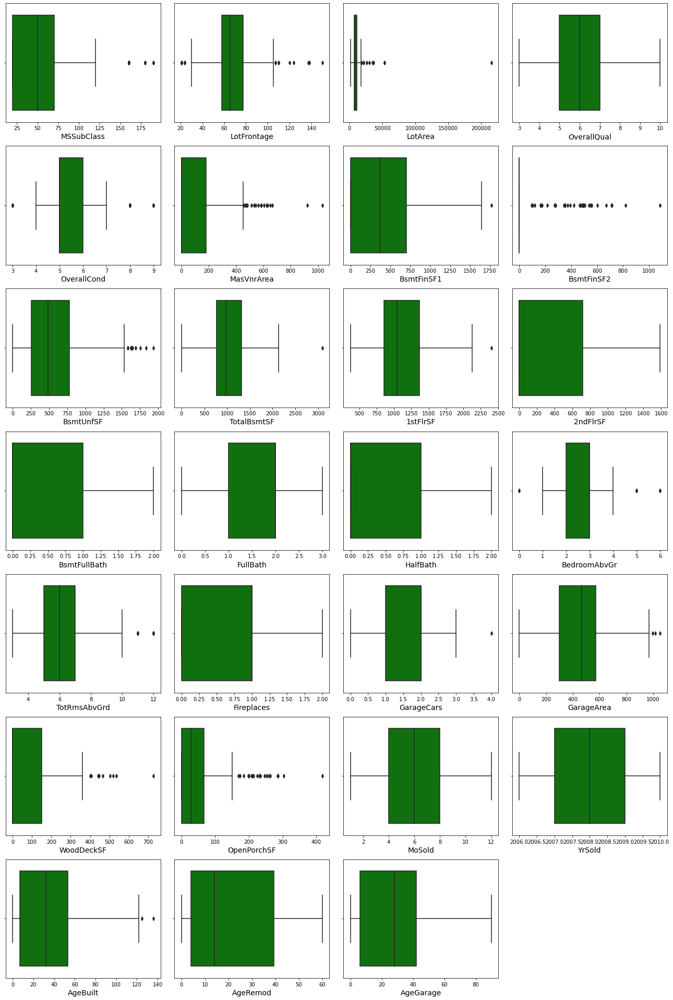

In [205]:
# Identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_colte:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(test_df[column],color="g")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

In [206]:
# Feature containing outliers
features_te = test_df[['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 'BedroomAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF']]



In [207]:
# Removing outliers in train data using percentile method 
for col in features_te:
    if train_df[col].dtypes != 'object':
        percentile = train_df[col].quantile([0.01,0.98]).values
        train_df[col][train_df[col]<=percentile[0]]=percentile[0]
        train_df[col][train_df[col]>=percentile[1]]=percentile[1]
        

So we removed outlier from our test data

# Checking Skewness

In [208]:
test_df.skew()

MSSubClass       1.358597
LotFrontage      0.447581
LotArea         12.781805
OverallQual      0.397312
OverallCond      1.209714
MasVnrArea       1.976804
BsmtFinSF1       0.739790
BsmtFinSF2       3.698543
BsmtUnfSF        0.960708
TotalBsmtSF      0.519257
1stFlrSF         0.692047
2ndFlrSF         0.765511
BsmtFullBath     0.463685
FullBath        -0.049800
HalfBath         0.758892
BedroomAbvGr     0.075315
TotRmsAbvGrd     0.805535
Fireplaces       0.540164
GarageCars      -0.280324
GarageArea       0.133547
WoodDeckSF       1.708221
OpenPorchSF      2.185030
MoSold           0.186504
YrSold           0.018412
AgeBuilt         0.756971
AgeRemod         0.533693
AgeGarage        0.677341
dtype: float64

# Removing skewness using Yeo-Johnson method

In [209]:
# Removing skewness using yeo-johnson  method to get better prediction
skew2 = ["MSSubClass","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","1stFlrSF","2ndFlrSF","HalfBath","TotRmsAbvGrd","Fireplaces","WoodDeckSF","OpenPorchSF","AgeBuilt","AgeGarage"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

test_df[skew2] = scaler.fit_transform(test_df[skew2].values)
test_df[skew2].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,HalfBath,TotRmsAbvGrd,Fireplaces,WoodDeckSF,OpenPorchSF,AgeBuilt,AgeGarage
0,-1.149768,0.842656,1.182923,1.205140,0.455087,1.814725,-0.870294,-0.738058,0.961793,0.808861,1.119038,0.718308,-1.416532,-1.398310
1,1.337666,-0.739104,-0.846534,1.064798,-0.841820,0.726749,-0.870294,-0.738058,-1.618327,0.808861,0.813787,-1.111540,-0.005055,0.158683
2,-1.149768,0.524304,-0.846534,-1.375716,2.127575,1.586900,-0.870294,-0.738058,0.447622,0.808861,1.153748,1.278346,-0.824418,-0.763715
3,0.705404,0.548484,-0.846534,0.235689,-0.093395,-0.705442,1.137231,1.349285,0.447622,0.808861,-0.913570,-1.111540,1.052874,1.406010
4,0.507343,0.897263,0.952580,-1.375716,0.870427,-0.584696,1.211129,1.349285,1.420534,0.808861,0.954066,0.218396,-1.585761,-1.573315


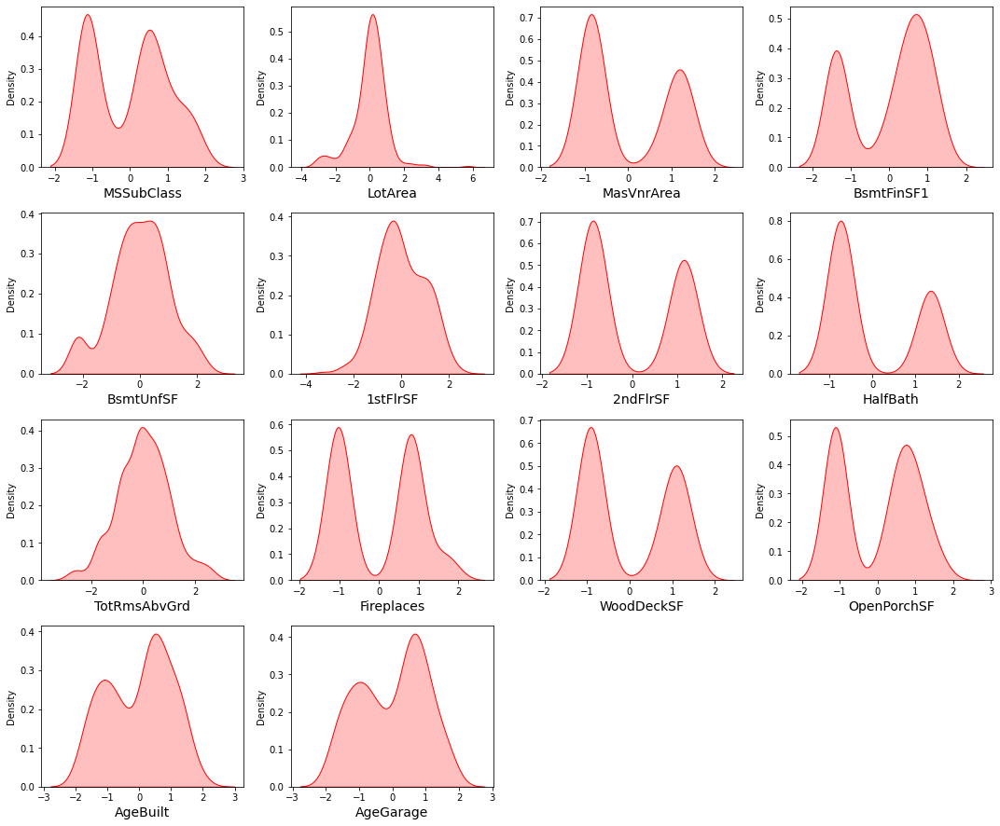

In [181]:
plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in test_df[skew2] :
    if plotnumber<=17:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(test_df[column],color="r",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

Ploted the Skewness removed data

# EnCoding

In [210]:
#Ordinal encoding
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
from sklearn.preprocessing import OrdinalEncoder
ord_enc=OrdinalEncoder()
for i in column:
    test_df[i] = ord_enc.fit_transform(test_df[i].values.reshape(-1,1))

In [211]:
#For remainig Label encoding
from sklearn.preprocessing import LabelEncoder
lbl_enc=LabelEncoder()
for i in test_df.columns:
    if test_df[i].dtypes == "object":
        test_df[i] =lbl_enc.fit_transform(test_df[i].values.reshape(-1,1))

# Predicting the saved model

In [212]:
# Loading the saved model
Model=joblib.load("HousingPricePrediction.pkl")

#Prediction
prediction = Model.predict(test_df)
prediction

array([317286.6, 352142.2, 325786.6, 342717.4, 306286.6, 291311.4,
       293511.4, 345586.6, 351142.2, 272086.6, 290111.4, 327711.4,
       280686.6, 331311.4, 326711.4, 285984.4, 277886.6, 290111.4,
       272086.6, 315711.4, 284086.6, 342717.4, 315711.4, 177800. ,
       318695.8, 290111.4, 306286.6, 327711.4, 337311.4, 327711.4,
       210195.8, 268686.6, 314786.6, 352142.2, 280686.6, 330717.4,
       272086.6, 282111.4, 320311.4, 340142.2, 280686.6, 342634.8,
       306286.6, 268686.6, 284086.6, 328855.6, 290111.4, 290111.4,
       306286.6, 320286.6, 245400. , 326711.4, 211124.8, 290111.4,
       328217.4, 284086.6, 316855.6, 306286.6, 293511.4, 314786.6,
       294111.4, 306286.6, 318286.6, 284086.6, 306286.6, 294111.4,
       280686.6, 282286.6, 280686.6, 303711.4, 281658.6, 320311.4,
       328855.6, 278111.4, 342717.4, 306286.6, 341717.4, 303786.6,
       317286.6, 352142.2, 306286.6, 266824.8, 291711.4, 352142.2,
       306286.6, 317286.6, 296986.6, 307423.4, 284086.6, 30628

# Creating DataFrame and Saving the predictions

In [213]:
# Creating dataframe for the predicted results 
Prediction = pd.DataFrame()
Prediction['SalePrice']= prediction
Prediction

,SalePrice
0,317286.6
1,352142.2
2,325786.6
3,342717.4
4,306286.6
5,291311.4
6,293511.4
7,345586.6
8,351142.2
9,272086.6


In [214]:
Prediction.to_csv("Predicted_SalePrice.csv", index=False)

# Conclusion:

Which variables are important to predict the price of house?

Overall Quality is the most contributing and highest positive impacting feature. Also, the features like GarageArea, LotArea, 1stFlrSF, TotalBsmtSF etc have some what linear relation with the price variable.

How do these variables describe the price of the house?

The houses which have very excellent overall quality like material and finish of the house have high sale price. Also we have observed from the plot that as the overall quality of the house increases,the sale price also increases. That is there is good linear relation between SalePrice and OverallQual. So, if the seller builds the house according to these types of qualities that will increase the sale price of the house.
There is a linear relation between the SalePrice and 1stFlrSF. As we have seen as the 1st floor area increases, sales price also increases moderately. So, people like to live in the houses which have only 1-2 floors and the cost of the house also increases in this case.
Also, we have seen the positive linear relation between the SalePrice and GarageArea. As size of garage area increases, sale price also increases.
There is positive linear relation between sale price nad TotalBsmtSF. As total basement area increases, sale price also increases.
Uisng the features which have some relation with target we have built many ML models also seen the increase in accuracy of the best model.
Some of the additional features like pool does not have much influance on sale price